In [147]:
import pandas as pd
import numpy as np
import io
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import scipy
from scipy.fftpack import fftshift
from matplotlib import style
import missingno as msno
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os
import warnings
warnings.filterwarnings("ignore")
# warnings.filterwarnings('always')
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.preprocessing import KBinsDiscretizer
plt.style.use("bmh")
sns.set(style='whitegrid',color_codes=True)
%matplotlib inline
from sklearn.decomposition import PCA

from scipy.stats import spearmanr, kendalltau
import missingno as msno
import os
import joblib
import tarfile
import urllib


# classifiaction.
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC,SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,BaggingClassifier,AdaBoostClassifier,ExtraTreesClassifier,StackingClassifier
# HistGradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.tree import plot_tree
from sklearn.ensemble import VotingClassifier
from sklearn.naive_bayes import BernoulliNB,GaussianNB,MultinomialNB
# #regression
# from sklearn.svm import SVR
# from sklearn.neighbors import KNeighborsRegressor
# from sklearn.linear_model import LogisticRegression
# from sklearn.tree import DecisionTreeRegressor
# from xgboost import XGBRegressor
# from catboost import CatBoostRegressor
# from lightgbm import LGBMRegressor
# from sklearn.ensemble import RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor,AdaBoostRegressor
# from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet,RidgeCV

#model selection
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict, KFold, train_test_split, cross_validate

# #evaluation metrics
# from sklearn.metrics import mean_squared_log_error,mean_squared_error, r2_score,mean_absolute_error # for regression
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score, plot_confusion_matrix, classification_report  # for classification

from sklearn import metrics
from sklearn.metrics import roc_auc_score, roc_curve, classification_report

from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier

# Preprocessing & Imputing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# Validating and Tuning
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit 
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from sklearn.metrics import roc_curve, auc,roc_auc_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier

from tpot import TPOTClassifier

from sklearn.metrics import classification_report, confusion_matrix  

In [190]:
train = pd.read_csv('train.csv')
df=train.copy()

In [191]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10834 entries, 0 to 10833
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ID               10834 non-null  int64  
 1   Area             10834 non-null  int64  
 2   Perimeter        10834 non-null  float64
 3   MajorAxisLength  10834 non-null  float64
 4   MinorAxisLength  10834 non-null  float64
 5   AspectRation     10834 non-null  float64
 6   Eccentricity     10834 non-null  float64
 7   ConvexArea       10834 non-null  int64  
 8   EquivDiameter    10834 non-null  float64
 9   Extent           10834 non-null  float64
 10  Solidity         10834 non-null  float64
 11  roundness        10834 non-null  float64
 12  Compactness      10834 non-null  float64
 13  ShapeFactor1     10834 non-null  float64
 14  ShapeFactor2     10834 non-null  float64
 15  ShapeFactor3     10834 non-null  float64
 16  ShapeFactor4     10834 non-null  float64
 17  y           

In [135]:
df.y.value_counts(normalize=True).sort_values(ascending=False)

DERMASON    0.261861
SIRA        0.194665
SEKER       0.149622
HOROZ       0.137345
CALI        0.120362
BARBUNYA    0.097563
BOMBAY      0.038582
Name: y, dtype: float64

In [206]:
def plot_pie(df):
  labels = ['HOROZ', 'SEKER', 'DERMASON', 'SIRA', 'BARBUNYA', 'CALI', 'BOMBAY']
  values = df["y"].value_counts().to_list()
#   x = [i/len(df) for i in values]
  colors = ['gold', 'royalblue']

  # Pie plot
  fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.4)])
  fig.update_traces(hoverinfo="label+value+text", textfont_size=20, textinfo="value",
                   marker=dict(colors=colors, line=dict(color="white", width=2)))
  fig.update_layout(dict(title="Customer Churn"))
  fig.show()

In [8]:
values = df["y"].value_counts().to_list()
x = ['{0:.2f}%'.format(i/len(df)) for i in values]

In [9]:
plot_pie(df)

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,10834.0,5416.500000,3127.650742,0.000000,2708.250000,5416.500000,8124.750000,10833.000000
Area,10834.0,53095.675189,29542.542580,20420.000000,36343.500000,44645.000000,61295.000000,254616.000000
Perimeter,10834.0,855.274892,214.991122,524.932000,703.601250,793.739500,975.517500,1985.370000
MajorAxisLength,10834.0,320.036169,85.961630,183.601165,253.501071,296.377365,376.068399,738.860153
MinorAxisLength,10834.0,202.410342,45.113965,129.576207,175.927024,192.525040,217.315195,450.926187
AspectRation,10834.0,1.581294,0.244314,1.024868,1.432985,1.550761,1.703029,2.388873
Eccentricity,10834.0,0.750588,0.091481,0.218951,0.716250,0.764314,0.809450,0.908167
ConvexArea,10834.0,53816.205926,29999.710739,20684.000000,36731.250000,45148.000000,62251.500000,263261.000000
EquivDiameter,10834.0,253.123583,59.433080,161.243764,215.113880,238.419335,279.362162,569.374358
Extent,10834.0,0.749937,0.048949,0.555315,0.718778,0.760141,0.786871,0.866195


In [11]:
df.describe(include='O')

,y
count,10834
unique,7
top,DERMASON
freq,2837


<AxesSubplot:>

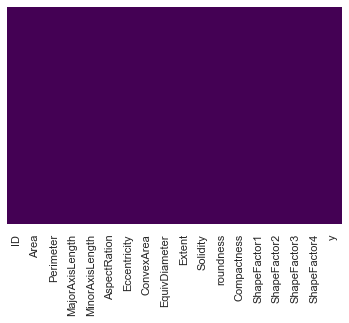

In [12]:
sns.heatmap(df.isnull(), cmap='viridis', cbar=False, yticklabels=False)

### The Skeweness near to 0, the  Kurtosis must be near to 3, the mean it is a Symmetric series.

In [207]:
from scipy.stats import boxcox

In [158]:
# df['Area_log'] = np.log(df['Area']) 
# df['Area_sq'] = np.sqrt(df['Area']) #positive
# df['Eccentricity_log'] = np.exp(df['Eccentricity']) 
# df['Eccentricity_sq'] = np.sqrt(max(df['Eccentricity']+1) - df['Eccentricity']) # nevative
# t = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
#        'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
#        'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
#        'ShapeFactor3', 'ShapeFactor4',]

# # Box-Cox Transformation in Python
# for i in t:
    
#     df[i] = boxcox(df[i])[0]

In [248]:
# df['Solidity'] = np.exp(df['Solidity'])

In [265]:
df.skew()

ID                 0.000000
Area               2.970246
Perimeter          1.650773
MajorAxisLength    1.390286
MinorAxisLength    2.251468
AspectRation       0.589186
Eccentricity      -1.075626
ConvexArea         2.960315
EquivDiameter      1.971378
Extent            -0.900892
Solidity          -2.507634
roundness         -0.659566
Compactness        0.038242
ShapeFactor1      -0.544873
ShapeFactor2       0.292677
ShapeFactor3       0.245589
ShapeFactor4      -2.508329
dtype: float64

In [247]:
df.kurtosis()

ID                 -1.200000
Area                1.744023
Perimeter           3.673793
MajorAxisLength     2.640599
MinorAxisLength     2.746681
AspectRation        0.169588
Eccentricity        1.460951
ConvexArea          1.706280
EquivDiameter       5.267857
Extent              0.664159
Solidity           12.915000
roundness           0.460578
Compactness        -0.190212
ShapeFactor1        0.730050
ShapeFactor2       -0.847298
ShapeFactor3       -0.112545
ShapeFactor4       11.691832
dtype: float64

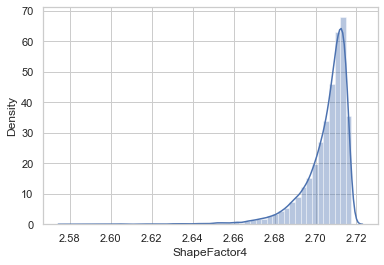

<Figure size 432x288 with 0 Axes>

In [263]:
sns.distplot(df['ShapeFactor4'])  
fig = plt.figure()

In [272]:
np.array(df['Area']).reshape(-1, 1)

array([[58238],
       [44515],
       [31662],
       ...,
       [81837],
       [48212],
       [28026]], dtype=int64)

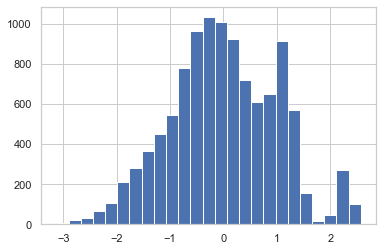

In [275]:
from sklearn.preprocessing import PowerTransformer

power = PowerTransformer(method='box-cox', standardize=True)

area = np.array(df['Area']).reshape(-1, 1)
data_trans = power.fit_transform(area)
# histogram of the transformed data
plt.hist(data_trans, bins=25)
plt.show()

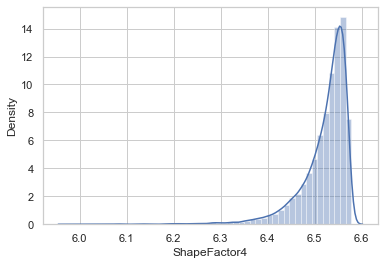

<Figure size 432x288 with 0 Axes>

In [264]:
df_log = df
df_log['ShapeFactor4'] = np.exp2(df_log['ShapeFactor4'])  
sns.distplot(df_log['ShapeFactor4'])  
fig = plt.figure()

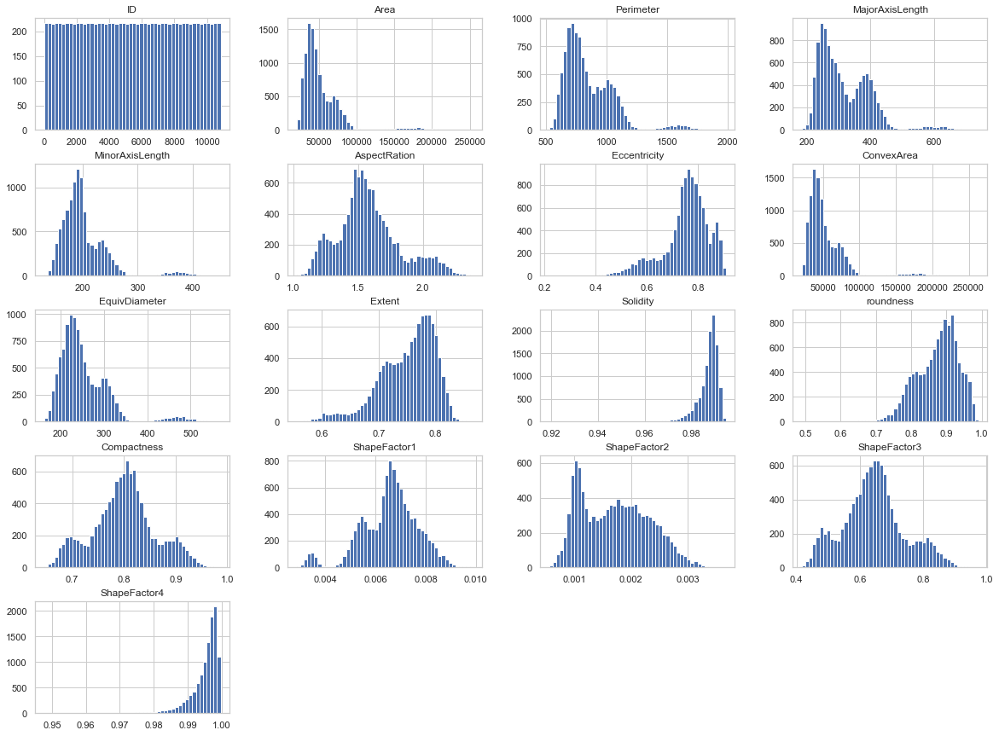

In [13]:
df.hist(bins=50, figsize=(20,15))
plt.show()

In [7]:
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "end_to_end_project"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)


def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


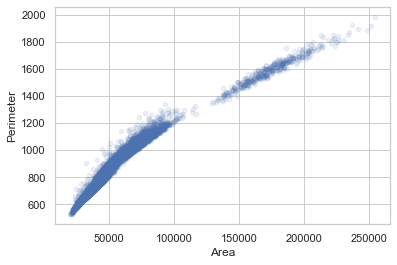

In [280]:
df.plot(kind="scatter", x="Area", y="Perimeter", alpha=0.1)
# save_fig("better_visualization_plot")
plt.show()

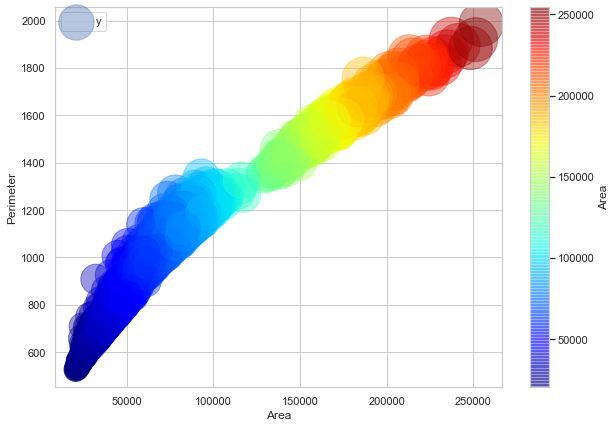

In [276]:
df.plot(kind="scatter", x="Area", y="Perimeter", alpha=0.4,
             s='Perimeter', label='y', figsize=(10,7),
             c='Area', cmap=plt.get_cmap("jet"), colorbar=True,
             sharex=False)
plt.legend()
plt.show()

In [300]:
A = df[['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength','AspectRation','y']]

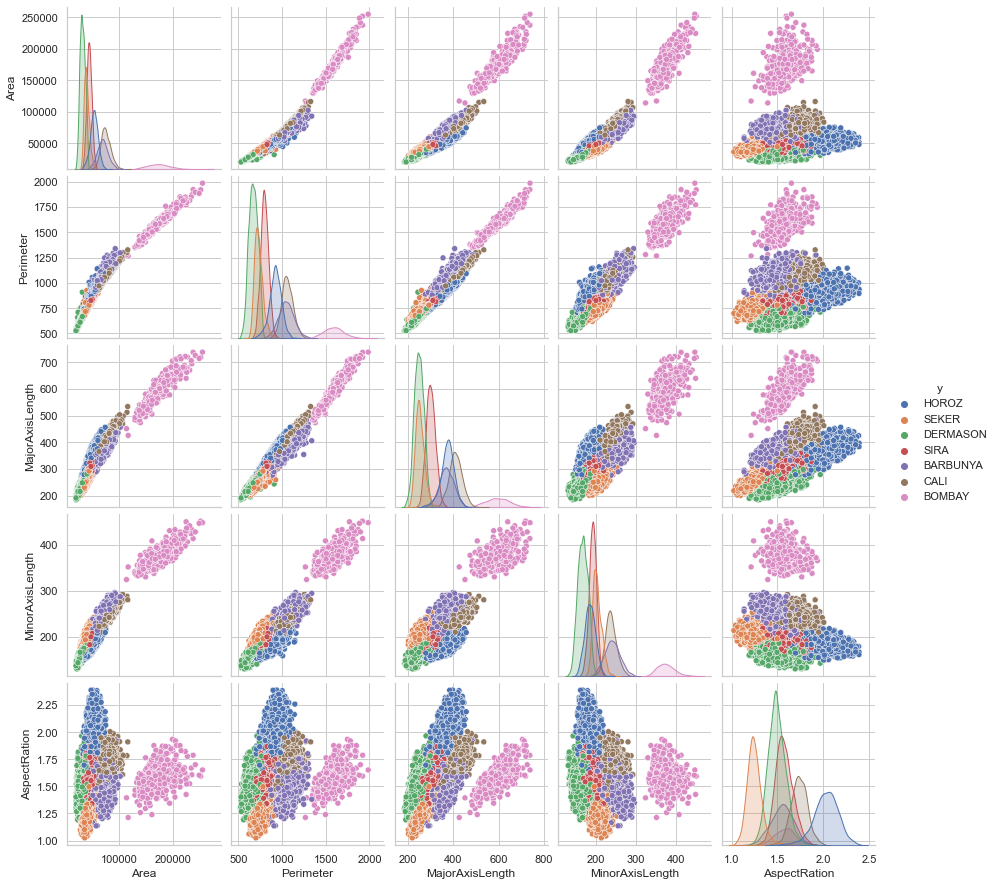

In [301]:
sns.pairplot(A, hue="y")

In [302]:
A = df[['Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent','Solidity','y']]

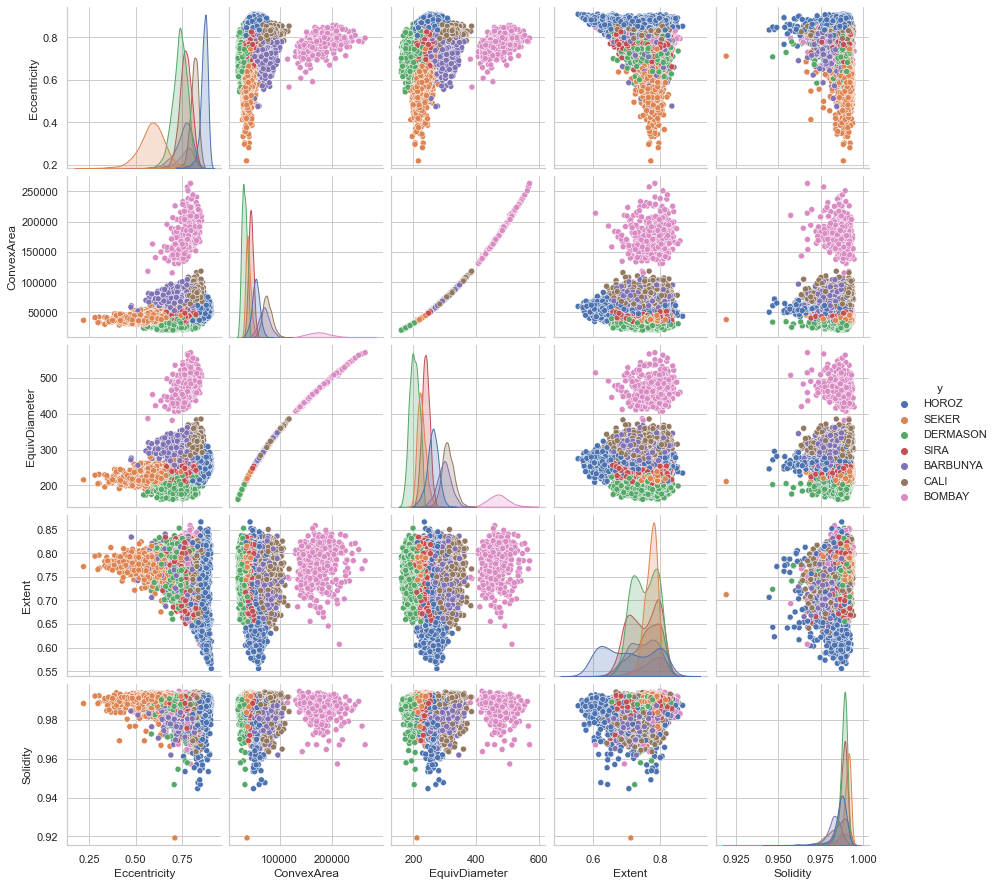

In [303]:
 sns.pairplot(A, hue="y")

In [304]:
A = df[['roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2','ShapeFactor3', 'ShapeFactor4','y']]

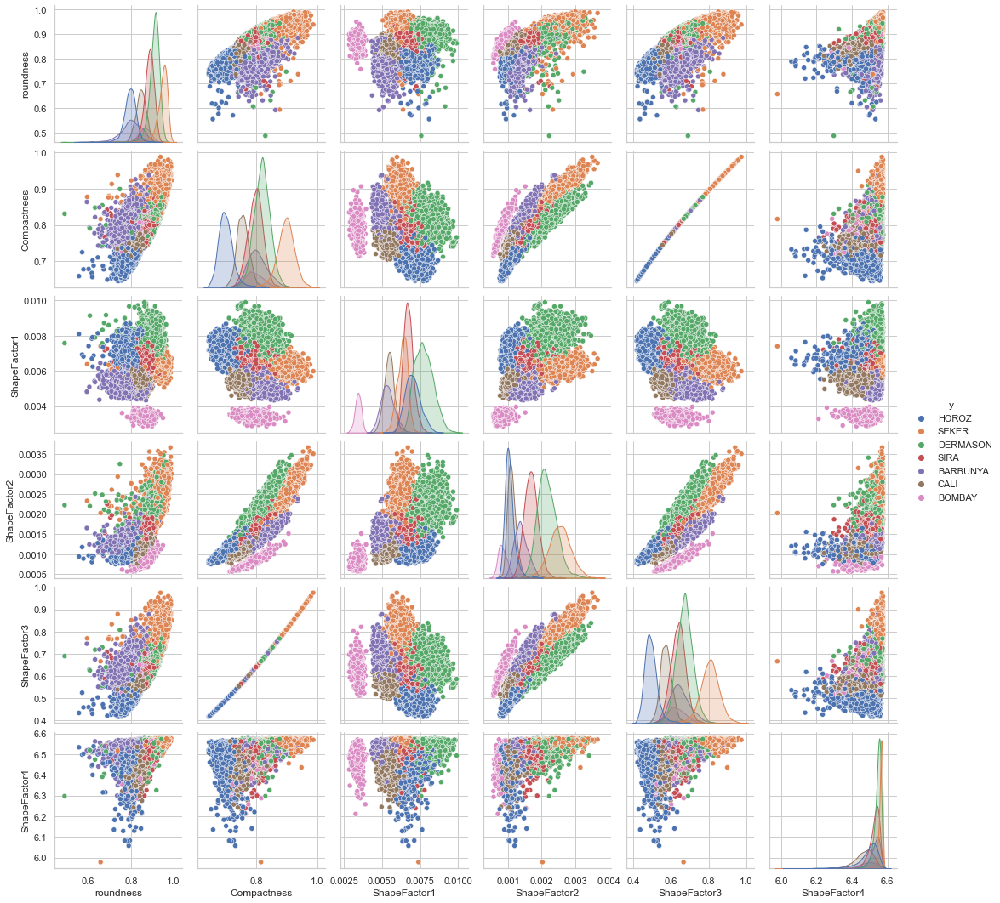

In [305]:
 sns.pairplot(A, hue="y")

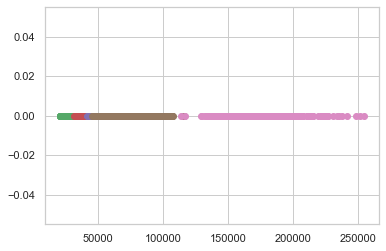

In [153]:
df_HOROZ = df.loc[df["y"] == "HOROZ"];
df_SEKER = df.loc[df["y"] == "SEKER"];
df_DERMASON = df.loc[df["y"] == "DERMASON"];
df_SIRA = df.loc[df["y"] == "SIRA"];
df_BARBUNYA = df.loc[df["y"] == "BARBUNYA"];
df_CALI = df.loc[df["y"] == "CALI"];
df_BOMBAY = df.loc[df["y"] == "BOMBAY"];

#print(iris_setosa["petal_length"])
plt.plot(df_HOROZ["Area"], np.zeros_like(df_HOROZ["Area"]), 'o')
plt.plot(df_SEKER["Area"], np.zeros_like(df_SEKER["Area"]), 'o')
plt.plot(df_DERMASON["Area"], np.zeros_like(df_DERMASON["Area"]), 'o')
plt.plot(df_SIRA["Area"], np.zeros_like(df_SIRA["Area"]), 'o')
plt.plot(df_BARBUNYA["Area"], np.zeros_like(df_BARBUNYA["Area"]), 'o')
plt.plot(df_CALI["Area"], np.zeros_like(df_CALI["Area"]), 'o')
plt.plot(df_BOMBAY["Area"], np.zeros_like(df_BOMBAY["Area"]), 'o')

plt.show()

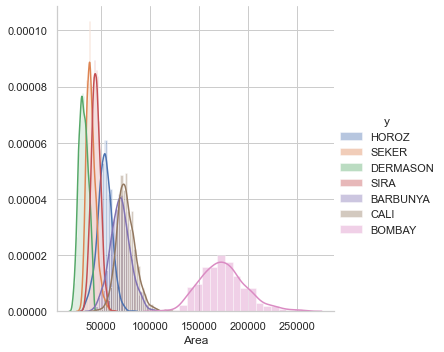

In [19]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "Area") \
   .add_legend();
plt.show();

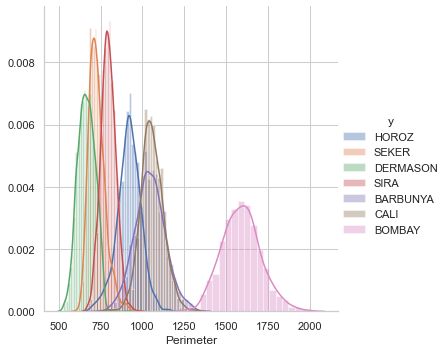

In [20]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "Perimeter") \
   .add_legend();
plt.show();

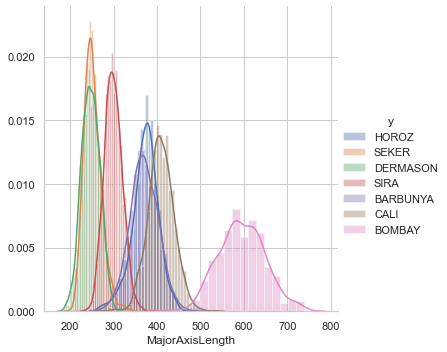

In [311]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "MajorAxisLength") \
   .add_legend();
plt.show();

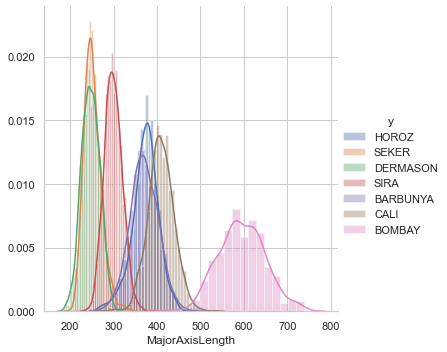

In [312]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "MajorAxisLength") \
   .add_legend();
plt.show();

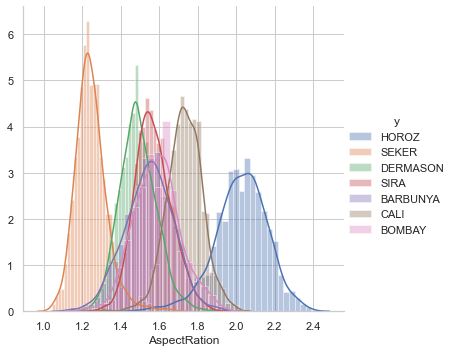

In [313]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "AspectRation") \
   .add_legend();
plt.show();

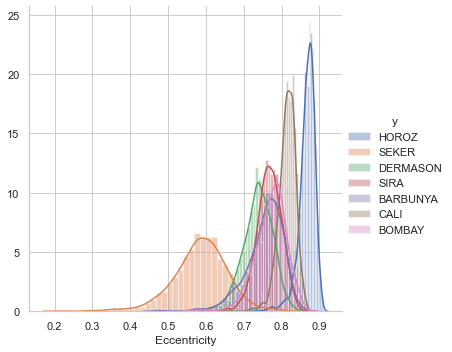

In [314]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "Eccentricity") \
   .add_legend();
plt.show();

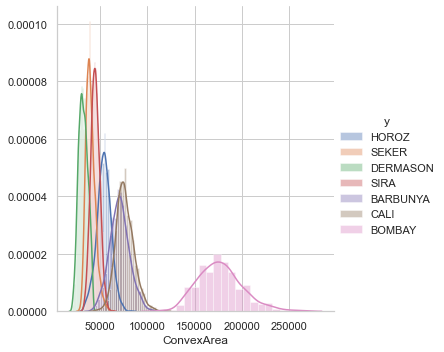

In [315]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "ConvexArea") \
   .add_legend();
plt.show();

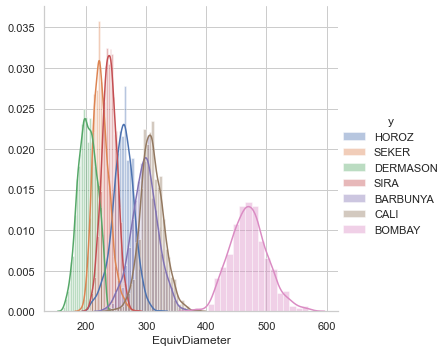

In [316]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "EquivDiameter") \
   .add_legend();
plt.show();

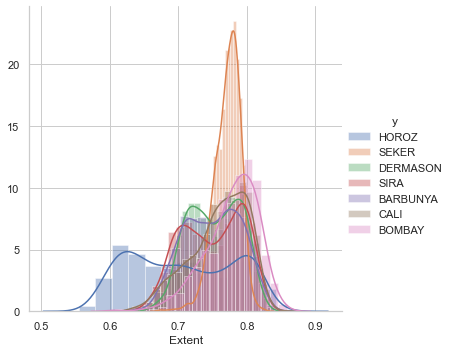

In [317]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "Extent") \
   .add_legend();
plt.show();

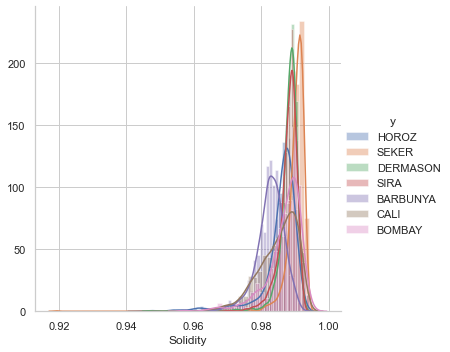

In [318]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "Solidity") \
   .add_legend();
plt.show();

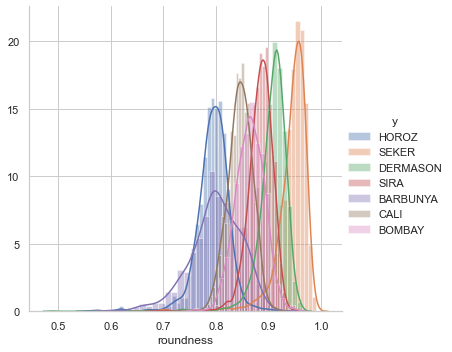

In [319]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "roundness") \
   .add_legend();
plt.show();

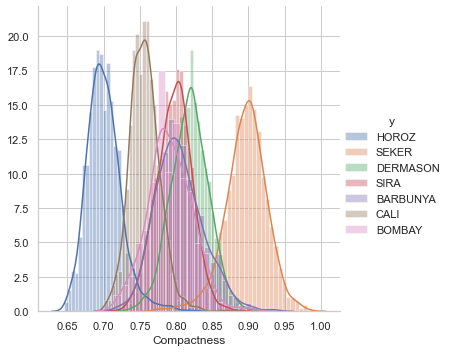

In [320]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "Compactness") \
   .add_legend();
plt.show();

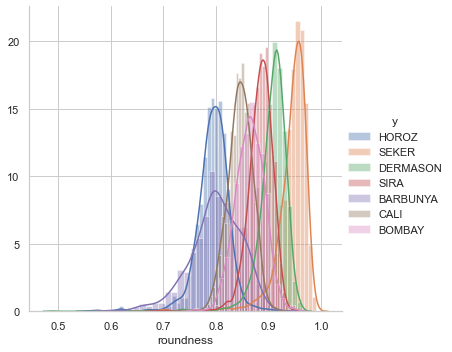

In [321]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "roundness") \
   .add_legend();
plt.show();

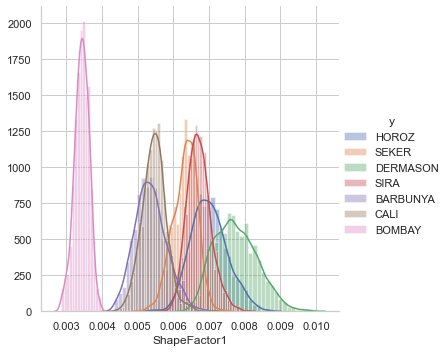

In [322]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "ShapeFactor1") \
   .add_legend();
plt.show();

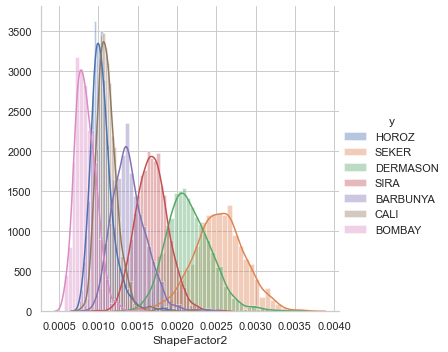

In [323]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "ShapeFactor2") \
   .add_legend();
plt.show();

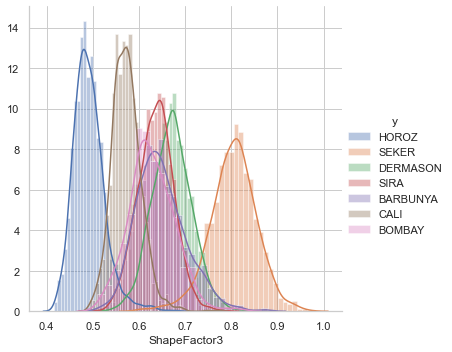

In [324]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "ShapeFactor3") \
   .add_legend();
plt.show();

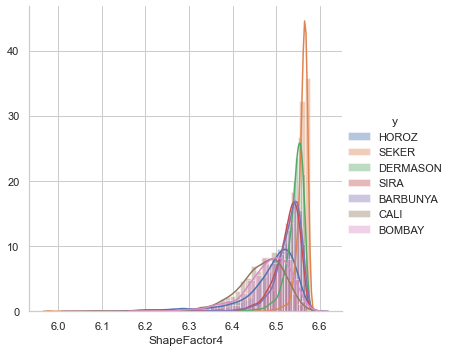

In [325]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "ShapeFactor4") \
   .add_legend();
plt.show();

[0.02486559 0.0530914  0.12163978 0.2405914  0.27217742 0.17876344
 0.07728495 0.02486559 0.00604839 0.00067204]
[33263.  38129.6 42996.2 47862.8 52729.4 57596.  62462.6 67329.2 72195.8
 77062.4 81929. ]


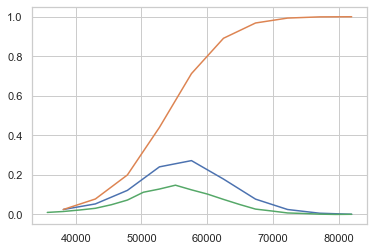

In [154]:
counts, bin_edges = np.histogram(df_HOROZ['Area'], bins=10,  density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges);
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf);
plt.plot(bin_edges[1:], cdf)


counts, bin_edges = np.histogram(df_HOROZ['Area'], bins=20, density = True)
pdf = counts/(sum(counts))
plt.plot(bin_edges[1:],pdf);

plt.show();


[0.02486559 0.0530914  0.12163978 0.2405914  0.27217742 0.17876344
 0.07728495 0.02486559 0.00604839 0.00067204]
[33263.  38129.6 42996.2 47862.8 52729.4 57596.  62462.6 67329.2 72195.8
 77062.4 81929. ]


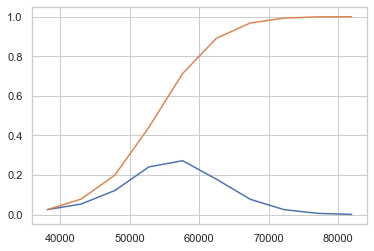

In [155]:
counts, bin_edges = np.histogram(df_HOROZ['Area'], bins=10, density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)

#compute CDF
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf)

plt.show();

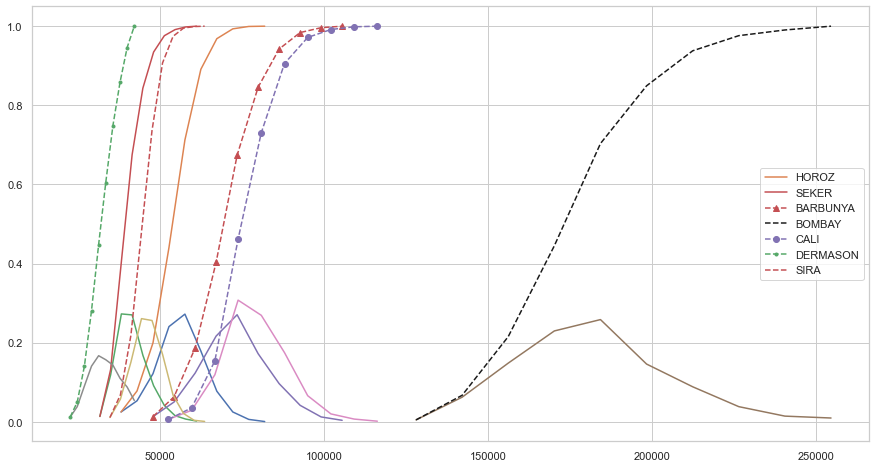

In [156]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
plt.legend()

plt.show();

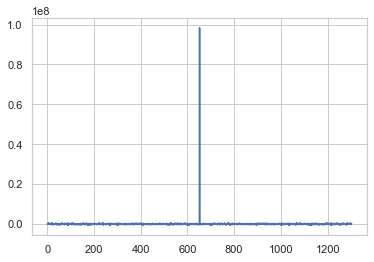

In [157]:
# df_HOROZ 
# df_SEKER 
# df_DERMASON 
# df_SIRA 
# df_BARBUNYA 
# df_CALI 
# df_BOMBAY 

yShift = fftshift(df_CALI.Area) # shift of the step function
Fourier_CALI = scipy.fft(yShift) # Fourier transform of y implementing the FFT
Fourier_CALI = fftshift(Fourier_CALI) # inverse shift of the Fourier Transform
plt.plot(Fourier_CALI)

df_CALI['Fourier_CALI'] =Fourier_CALI

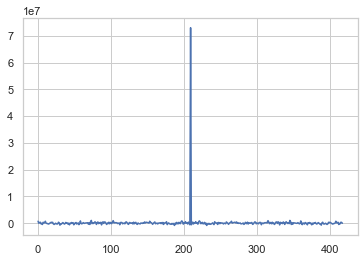

In [158]:
yShift = fftshift(df_BOMBAY.Area) # shift of the step function
Fourier_BOMBAY = scipy.fft(yShift) # Fourier transform of y implementing the FFT
Fourier_BOMBAY = fftshift(Fourier_BOMBAY) # inverse shift of the Fourier Transform
plt.plot(Fourier_BOMBAY)
df_BOMBAY['Fourier_BOMBAY'] =Fourier_BOMBAY

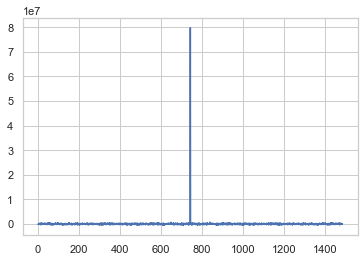

In [159]:
yShift = fftshift(df_HOROZ.Area) # shift of the step function
Fourier_HOROZ = scipy.fft(yShift) # Fourier transform of y implementing the FFT
Fourier_HOROZ = fftshift(Fourier_HOROZ) # inverse shift of the Fourier Transform
plt.plot(Fourier_HOROZ)
df_HOROZ['Fourier_HOROZ'] =Fourier_HOROZ

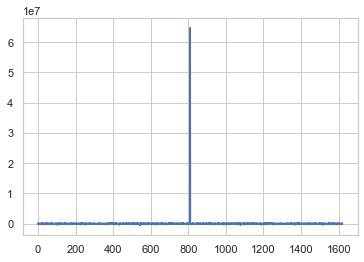

In [160]:
yShift = fftshift(df_SEKER.Area) # shift of the step function
Fourier_SEKER = scipy.fft(yShift) # Fourier transform of y implementing the FFT
Fourier_SEKER = fftshift(Fourier_SEKER) # inverse shift of the Fourier Transform
plt.plot(Fourier_SEKER)
df_SEKER['Fourier_SEKER'] =Fourier_SEKER

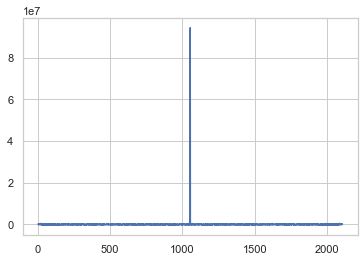

In [161]:
yShift = fftshift(df_SIRA.Area) # shift of the step function
Fourier_SIRA = scipy.fft(yShift) # Fourier transform of y implementing the FFT
Fourier_SIRA = fftshift(Fourier_SIRA) # inverse shift of the Fourier Transform
plt.plot(Fourier_SIRA)
df_SIRA['Fourier_SIRA'] =Fourier_SIRA

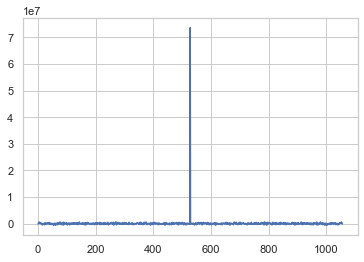

In [162]:
yShift = fftshift(df_BARBUNYA.Area) # shift of the step function
Fourier_BARBUNYA = scipy.fft(yShift) # Fourier transform of y implementing the FFT
Fourier_BARBUNYA = fftshift(Fourier_BARBUNYA) # inverse shift of the Fourier Transform
plt.plot(Fourier_BARBUNYA)
df_BARBUNYA['Fourier_BARBUNYA'] =Fourier_BARBUNYA

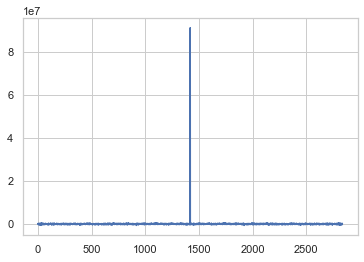

In [163]:
yShift = fftshift(df_DERMASON.Area) # shift of the step function
Fourier_DERMASON = scipy.fft(yShift) # Fourier transform of y implementing the FFT
Fourier_DERMASON = fftshift(Fourier_DERMASON) # inverse shift of the Fourier Transform
plt.plot(Fourier_DERMASON)
df_DERMASON['Fourier_DERMASON'] =Fourier_DERMASON

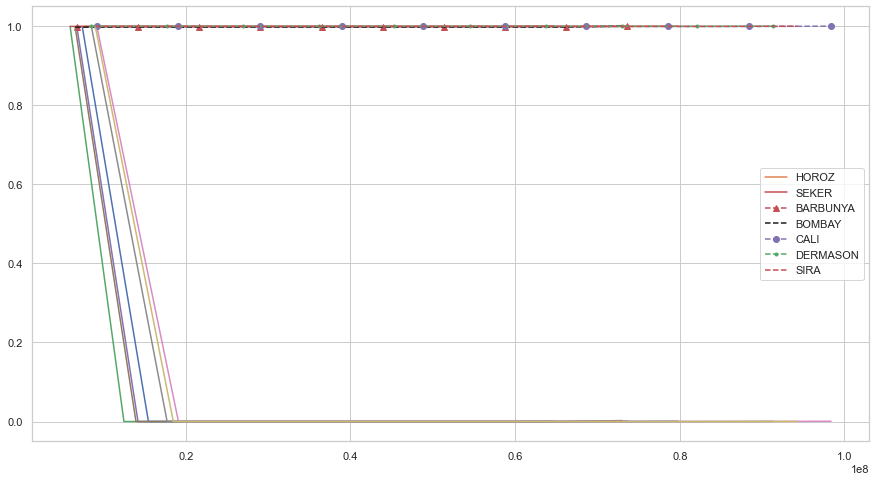

In [164]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Fourier_HOROZ'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Fourier_SEKER'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Fourier_BARBUNYA'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Fourier_BOMBAY'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Fourier_CALI'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Fourier_DERMASON'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Fourier_SIRA'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
plt.legend()

plt.show();

In [168]:
# df_HOROZ.Fourier_HOROZ.apply(lambda x:float(x))

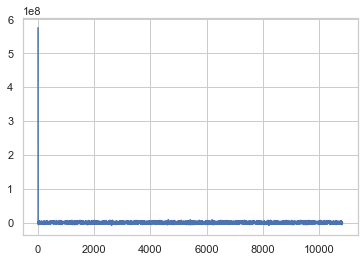

In [129]:
yShift = fftshift(df.Area) # shift of the step function
Fourier_Area = scipy.fft(df.Area) # Fourier transform of y implementing the FFT
Fourier_Area = fftshift(Fourier_Area) # inverse shift of the Fourier Transform
plt.plot(Fourier_Area)

df['Fourier_Area'] =Fourier_Area

df_HOROZ = df.loc[df["y"] == "HOROZ"];
df_SEKER = df.loc[df["y"] == "SEKER"];
df_DERMASON = df.loc[df["y"] == "DERMASON"];
df_SIRA = df.loc[df["y"] == "SIRA"];
df_BARBUNYA = df.loc[df["y"] == "BARBUNYA"];
df_CALI = df.loc[df["y"] == "CALI"];
df_BOMBAY = df.loc[df["y"] == "BOMBAY"];

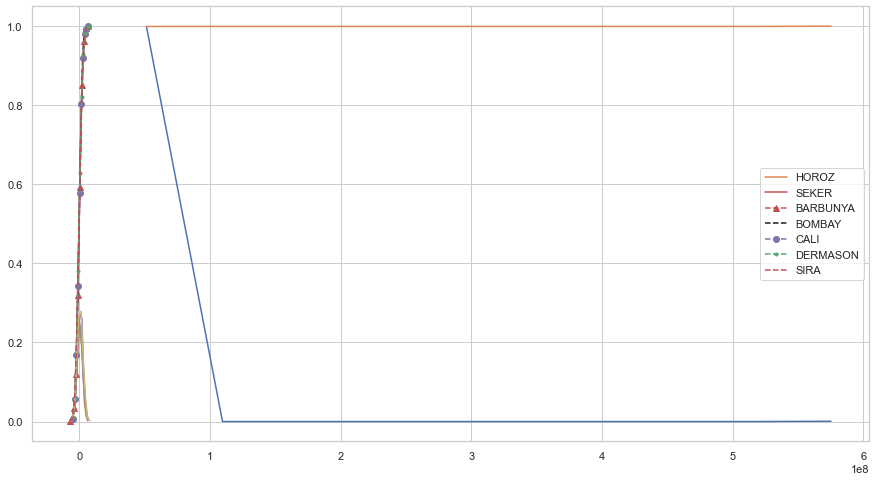

In [130]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Fourier_Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Fourier_Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Fourier_Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Fourier_Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Fourier_Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Fourier_Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Fourier_Area'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
plt.legend()

plt.show();

In [131]:
df.Fourier_Area.values

array([ 5.75238545e+08+8.61473382e-09j,  7.95693490e+05+1.03357171e+05j,
       -1.08878493e+06-1.43155967e+06j, ...,
       -2.96066032e+06+5.27115467e+05j, -1.08878493e+06+1.43155967e+06j,
        7.95693490e+05-1.03357171e+05j])

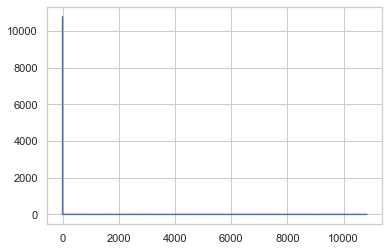

In [101]:
yShift = fftshift(df.ShapeFactor4) # shift of the step function
Fourier_ShapeFactor4 = scipy.fft(yShift) # Fourier transform of y implementing the FFT
# Fourier_ShapeFactor4 = fftshift(Fourier_ShapeFactor4) # inverse shift of the Fourier Transform
plt.plot(Fourier_ShapeFactor4)

df['Fourier_ShapeFactor4'] =Fourier_ShapeFactor4

df_HOROZ = df.loc[df["y"] == "HOROZ"];
df_SEKER = df.loc[df["y"] == "SEKER"];
df_DERMASON = df.loc[df["y"] == "DERMASON"];
df_SIRA = df.loc[df["y"] == "SIRA"];
df_BARBUNYA = df.loc[df["y"] == "BARBUNYA"];
df_CALI = df.loc[df["y"] == "CALI"];
df_BOMBAY = df.loc[df["y"] == "BOMBAY"];

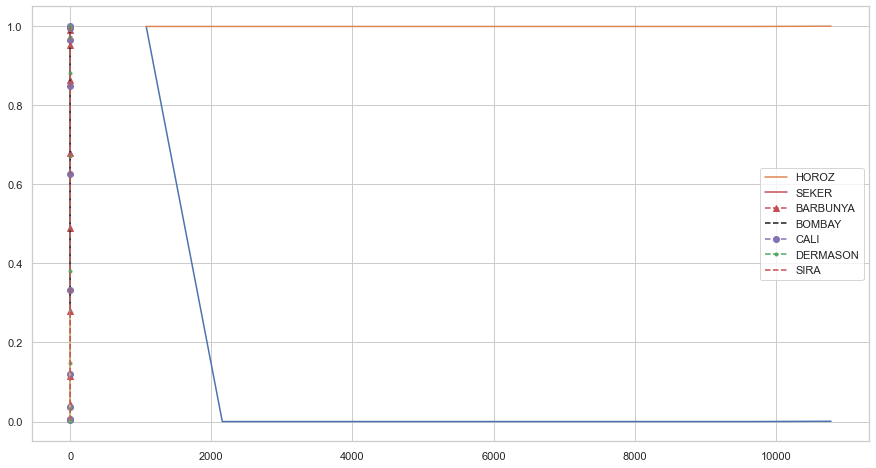

In [56]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Fourier_ShapeFactor4'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Fourier_ShapeFactor4'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Fourier_ShapeFactor4'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Fourier_ShapeFactor4'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Fourier_ShapeFactor4'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Fourier_ShapeFactor4'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Fourier_ShapeFactor4'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
plt.legend()

plt.show();

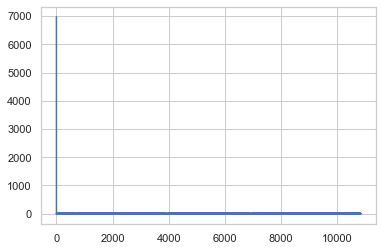

In [100]:
yShift = fftshift(df.ShapeFactor3) # shift of the step function
Fourier_ShapeFactor3 = scipy.fft(yShift) # Fourier transform of y implementing the FFT
# Fourier_ShapeFactor3 = fftshift(Fourier_ShapeFactor3) # inverse shift of the Fourier Transform
plt.plot(Fourier_ShapeFactor3)

df['Fourier_ShapeFactor3'] =Fourier_ShapeFactor3

df_HOROZ = df.loc[df["y"] == "HOROZ"];
df_SEKER = df.loc[df["y"] == "SEKER"];
df_DERMASON = df.loc[df["y"] == "DERMASON"];
df_SIRA = df.loc[df["y"] == "SIRA"];
df_BARBUNYA = df.loc[df["y"] == "BARBUNYA"];
df_CALI = df.loc[df["y"] == "CALI"];
df_BOMBAY = df.loc[df["y"] == "BOMBAY"];

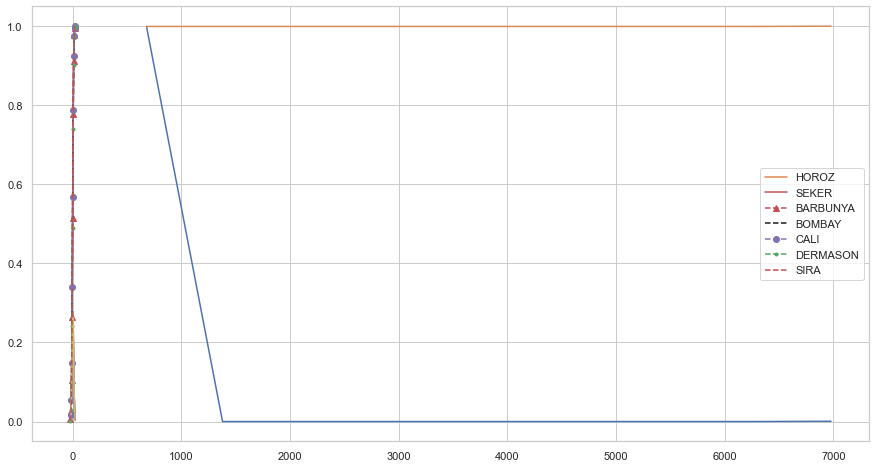

In [54]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Fourier_ShapeFactor3'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Fourier_ShapeFactor3'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Fourier_ShapeFactor3'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Fourier_ShapeFactor3'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Fourier_ShapeFactor3'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Fourier_ShapeFactor3'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Fourier_ShapeFactor3'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
plt.legend()

plt.show();

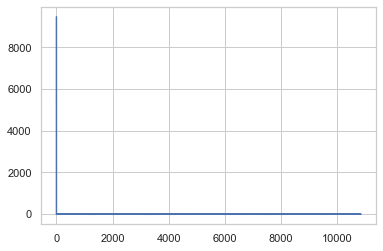

In [98]:
yShift = fftshift(df.roundness) # shift of the step function
Fourier_roundness = scipy.fft(yShift) # Fourier transform of y implementing the FFT
# Fourier_roundness = fftshift(Fourier_roundness) # inverse shift of the Fourier Transform
plt.plot(Fourier_roundness)

df['Fourier_roundness'] =Fourier_roundness

df_HOROZ = df.loc[df["y"] == "HOROZ"];
df_SEKER = df.loc[df["y"] == "SEKER"];
df_DERMASON = df.loc[df["y"] == "DERMASON"];
df_SIRA = df.loc[df["y"] == "SIRA"];
df_BARBUNYA = df.loc[df["y"] == "BARBUNYA"];
df_CALI = df.loc[df["y"] == "CALI"];
df_BOMBAY = df.loc[df["y"] == "BOMBAY"];

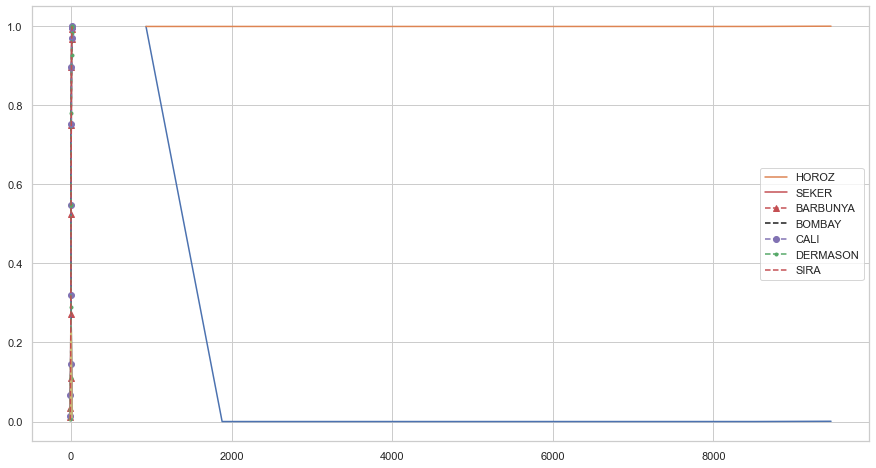

In [52]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
plt.legend()

plt.show();

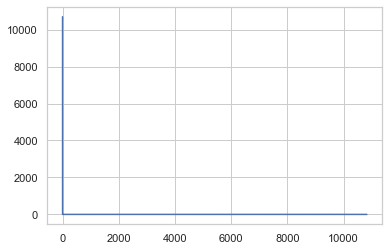

In [102]:
yShift = fftshift(df.Solidity) # shift of the step function
Fourier_Solidity = scipy.fft(yShift) # Fourier transform of y implementing the FFT
# Fourier_Solidity = fftshift(Fourier_Solidity) # inverse shift of the Fourier Transform
plt.plot(Fourier_Solidity)

df['Fourier_Solidity'] =Fourier_Solidity

df_HOROZ = df.loc[df["y"] == "HOROZ"];
df_SEKER = df.loc[df["y"] == "SEKER"];
df_DERMASON = df.loc[df["y"] == "DERMASON"];
df_SIRA = df.loc[df["y"] == "SIRA"];
df_BARBUNYA = df.loc[df["y"] == "BARBUNYA"];
df_CALI = df.loc[df["y"] == "CALI"];
df_BOMBAY = df.loc[df["y"] == "BOMBAY"];

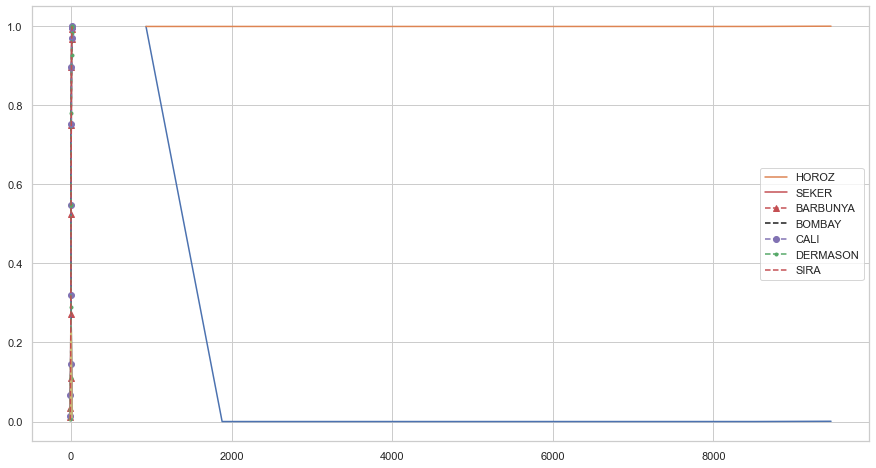

In [103]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
plt.legend()

plt.show();

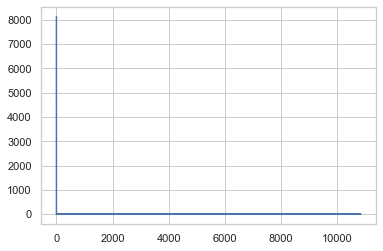

In [104]:
yShift = fftshift(df.Extent) # shift of the step function
Fourier_Extent = scipy.fft(yShift) # Fourier transform of y implementing the FFT
# Fourier_Extent = fftshift(Fourier_Extent) # inverse shift of the Fourier Transform
plt.plot(Fourier_Extent)

df['Fourier_Extent'] =Fourier_Extent

df_HOROZ = df.loc[df["y"] == "HOROZ"];
df_SEKER = df.loc[df["y"] == "SEKER"];
df_DERMASON = df.loc[df["y"] == "DERMASON"];
df_SIRA = df.loc[df["y"] == "SIRA"];
df_BARBUNYA = df.loc[df["y"] == "BARBUNYA"];
df_CALI = df.loc[df["y"] == "CALI"];
df_BOMBAY = df.loc[df["y"] == "BOMBAY"];

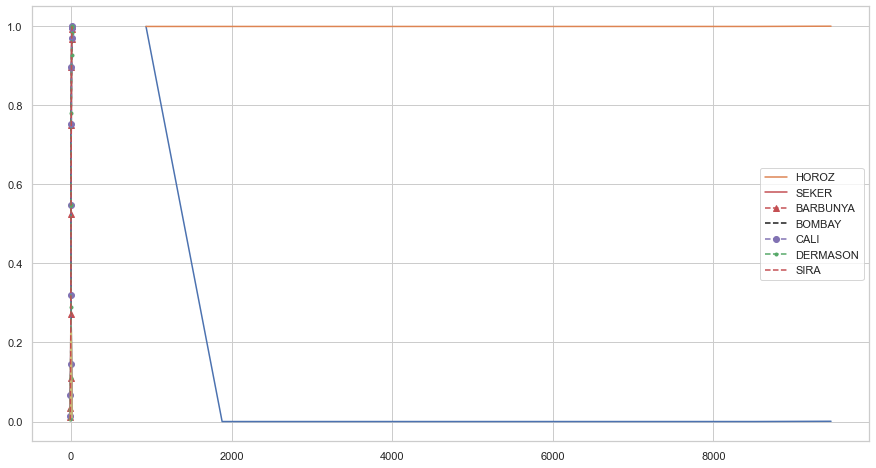

In [105]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Fourier_roundness'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
plt.legend()

plt.show();

In [337]:
#Mean, Variance, Std-deviation,  
# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

print("Means:")
print(np.mean(df_HOROZ["Area"]))
print(np.mean(df_SEKER["Area"]))
print(np.mean(df_BARBUNYA["Area"]))
print(np.mean(df_BOMBAY["Area"]))
print(np.mean(df_CALI["Area"]))
print(np.mean(df_DERMASON["Area"]))
print(np.mean(df_SIRA["Area"]))

print("\nStd-dev:");
print(np.std(df_HOROZ["Area"]))
print(np.std(df_SEKER["Area"]))
print(np.std(df_BARBUNYA["Area"]))
print(np.std(df_BOMBAY["Area"]))
print(np.std(df_CALI["Area"]))
print(np.std(df_DERMASON["Area"]))
print(np.std(df_SIRA["Area"]))


Means:
53621.0564516129
39966.113510178904
69673.2592242195
174644.6913875598
75440.76993865031
32197.808600634475
44712.792792792796

Std-dev:
7328.970315667972
4855.198589330279
10231.484700007277
22913.150746608728
9440.69482920165
4675.715008272695
4564.417998339016


In [338]:
#Median, Quantiles, Percentiles, IQR.
# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

print("\nMedians:")
print(np.median(df_HOROZ["Area"]))
print(np.median(df_SEKER["Area"]))
print(np.median(df_BARBUNYA["Area"]))
print(np.median(df_BOMBAY["Area"]))
print(np.median(df_CALI["Area"]))
print(np.median(df_DERMASON["Area"]))
print(np.median(df_SIRA["Area"]))

print("\nQuantiles:")
print(np.percentile(df_HOROZ["Area"],np.arange(0, 100, 25)))
print(np.percentile(df_SEKER["Area"],np.arange(0, 100, 25)))
print(np.percentile(df_BARBUNYA["Area"], np.arange(0, 100, 25)))
print(np.percentile(df_BOMBAY["Area"],np.arange(0, 100, 25)))
print(np.percentile(df_CALI["Area"],np.arange(0, 100, 25)))
print(np.percentile(df_DERMASON["Area"], np.arange(0, 100, 25)))
print(np.percentile(df_SIRA["Area"], np.arange(0, 100, 25)))

print("\n90th Percentiles:")
print(np.percentile(df_HOROZ["Area"],90))
print(np.percentile(df_SEKER["Area"],90))
print(np.percentile(df_BARBUNYA["Area"], 90))
print(np.percentile(df_BOMBAY["Area"],90))
print(np.percentile(df_CALI["Area"],90))
print(np.percentile(df_DERMASON["Area"], 90))
print(np.percentile(df_SIRA["Area"],90))

from statsmodels import robust
print ("\nMedian Absolute Deviation")
print(robust.mad(df_HOROZ["Area"]))
print(robust.mad(df_SEKER["Area"]))
print(robust.mad(df_BARBUNYA["Area"]))
print(robust.mad(df_BOMBAY["Area"]))
print(robust.mad(df_CALI["Area"]))
print(robust.mad(df_DERMASON["Area"]))
print(robust.mad(df_SIRA["Area"]))



Medians:
53777.0
39202.0
69509.0
172856.5
74641.5
31966.0
44591.0

Quantiles:
[33263.   48882.25 53777.   58421.25]
[28395. 36463. 39202. 42749.]
[41488. 62831. 69509. 76098.]
[114004.   157937.25 172856.5  187630.75]
[45504.   69089.25 74641.5  81403.  ]
[20420. 28654. 31966. 35660.]
[31519. 41565. 44591. 47767.]

90th Percentiles:
62761.9
46347.0
82907.0
203665.7
87809.1
38720.0
50675.6

Median Absolute Deviation
7088.321206675282
4569.380037434265
9890.43939965087
22061.121011363357
9029.047510699114
5156.490515962483
4616.823308426445


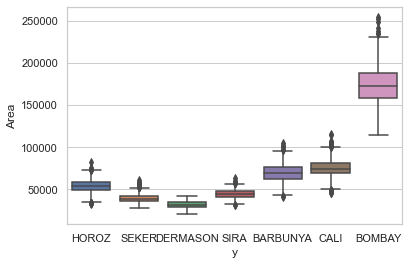

In [340]:
sns.boxplot(x='y',y='Area', data=df)
plt.show()

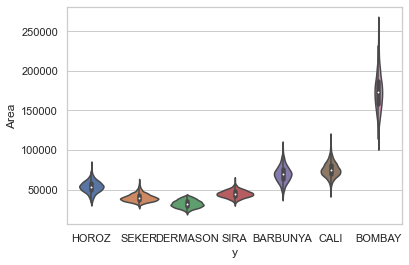

In [342]:
sns.violinplot(x='y',y='Area', data=df, size=8)
plt.show()

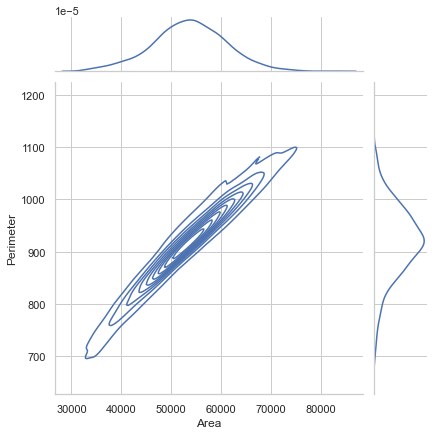

In [344]:
sns.jointplot(x="Area", y="Perimeter", data=df_HOROZ, kind="kde");
plt.show();

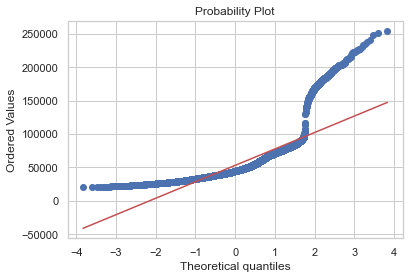

In [347]:
import pylab 

stats.probplot(df['Area'], dist="norm", plot=pylab)
pylab.show()

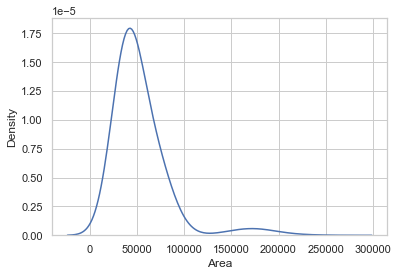

In [353]:
sns.kdeplot(df['Area'], bw=0.5)
plt.show()

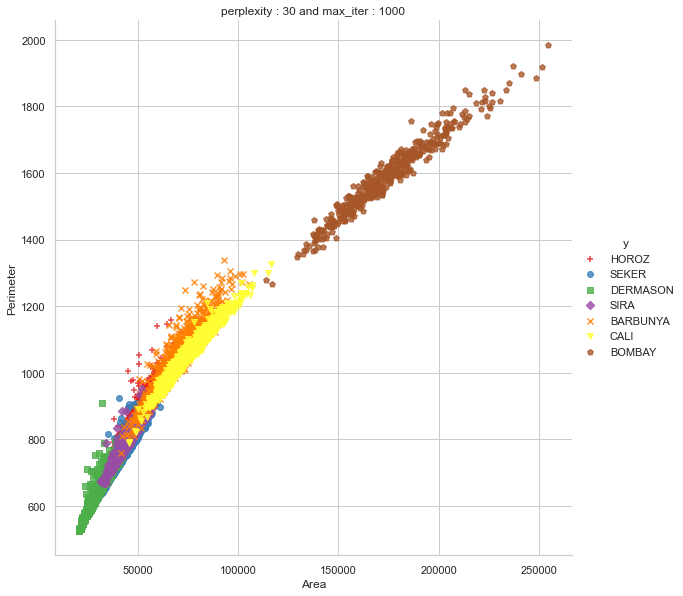

In [371]:
# ['.', ',', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_', 'P', 'X',
# 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 'None', None, ' ', '']
sns.lmplot(data=df, x='Area', y='Perimeter', hue='y', fit_reg=False, size=8,palette="Set1",\
           markers=["+","o", "s", "D","x",'v','p'])
plt.title("perplexity : {} and max_iter : {}".format(30, 1000))
plt.show()

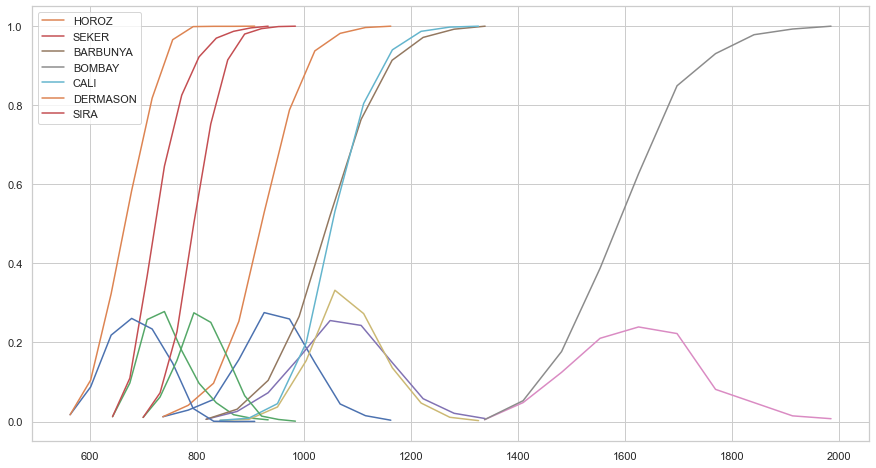

In [512]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA

counts, bin_edges = np.histogram(df_HOROZ['Perimeter'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.figure(figsize=(15,8))
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='HOROZ')


# virginica
counts, bin_edges = np.histogram(df_SEKER['Perimeter'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SEKER')


#versicolor
counts, bin_edges = np.histogram(df_BARBUNYA['Perimeter'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='BARBUNYA')

counts, bin_edges = np.histogram(df_BOMBAY['Perimeter'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='BOMBAY')


# virginica
counts, bin_edges = np.histogram(df_CALI['Perimeter'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='CALI')


#versicolor
counts, bin_edges = np.histogram(df_DERMASON['Perimeter'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='DERMASON')

counts, bin_edges = np.histogram(df_SIRA['Perimeter'], bins=10, density = True)
pdf = counts/(sum(counts))
# print(pdf);
# print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf,label='SIRA')
plt.legend()

plt.show();

In [536]:
t = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4']

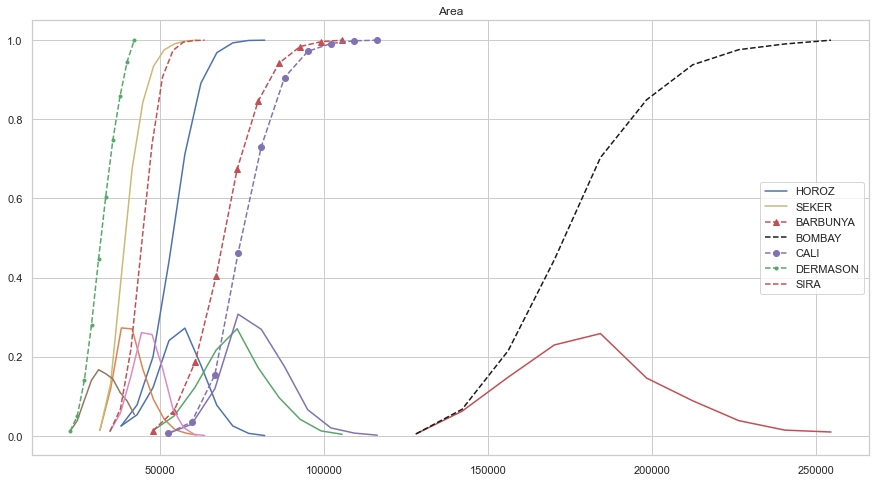

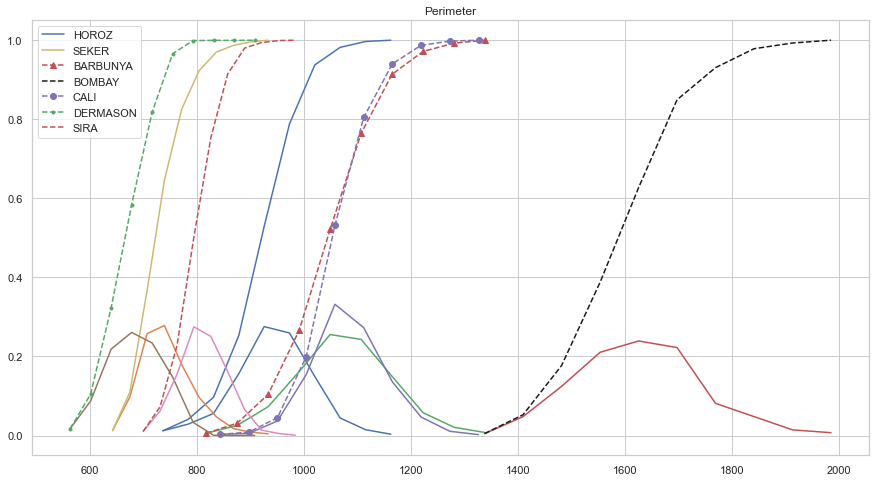

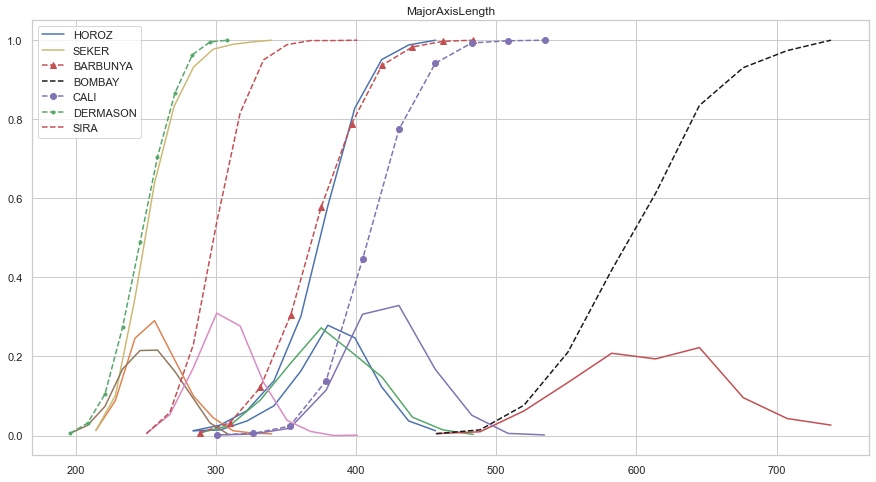

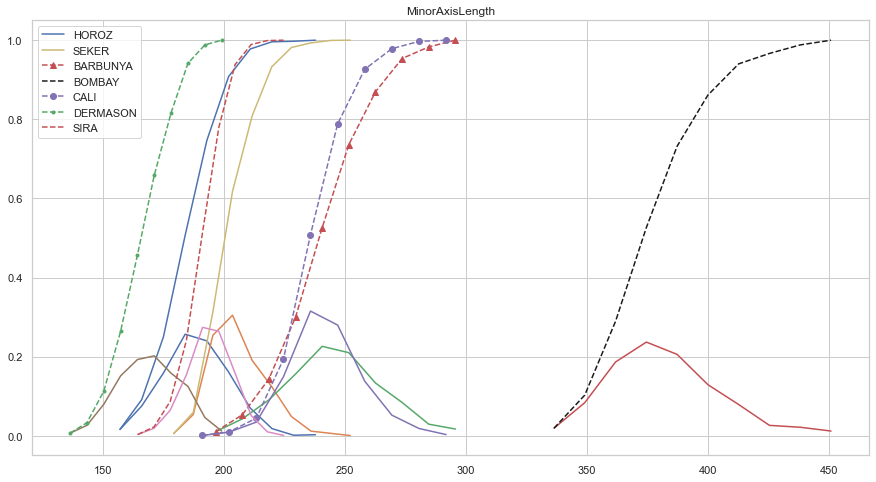

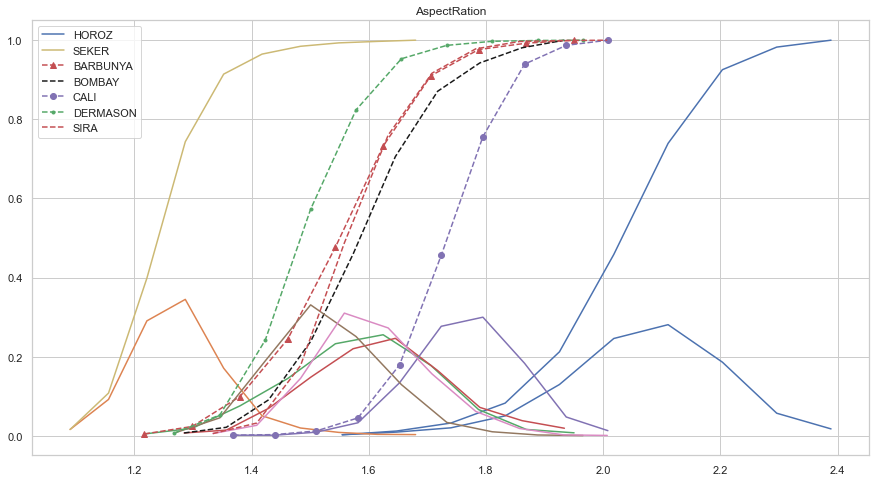

...

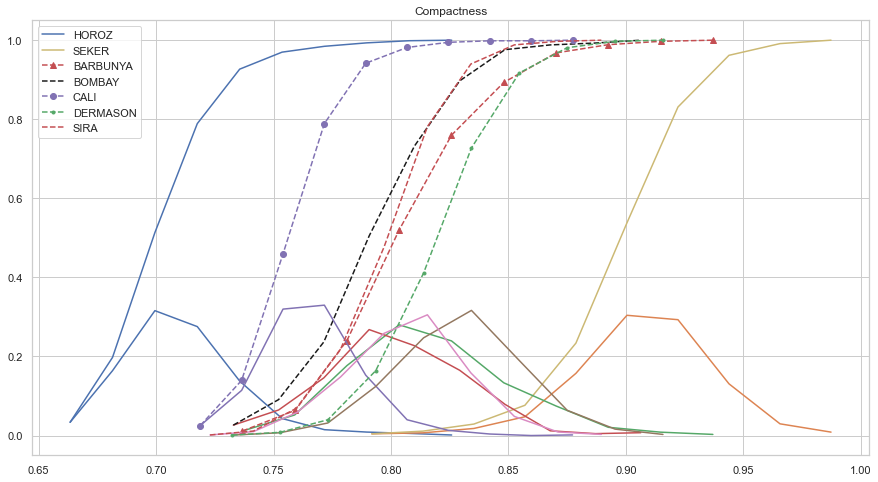

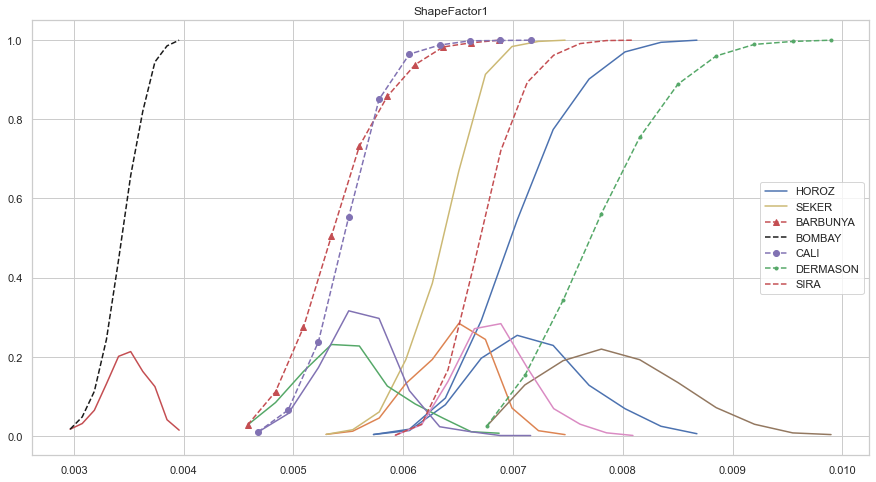

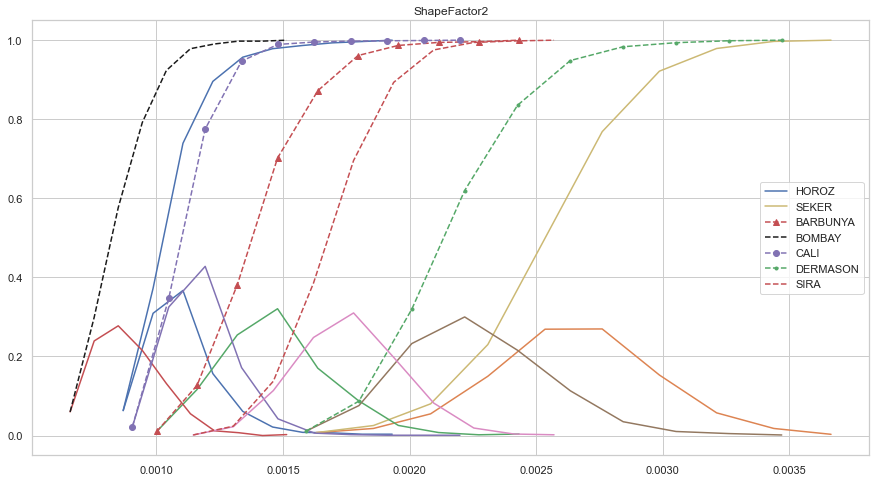

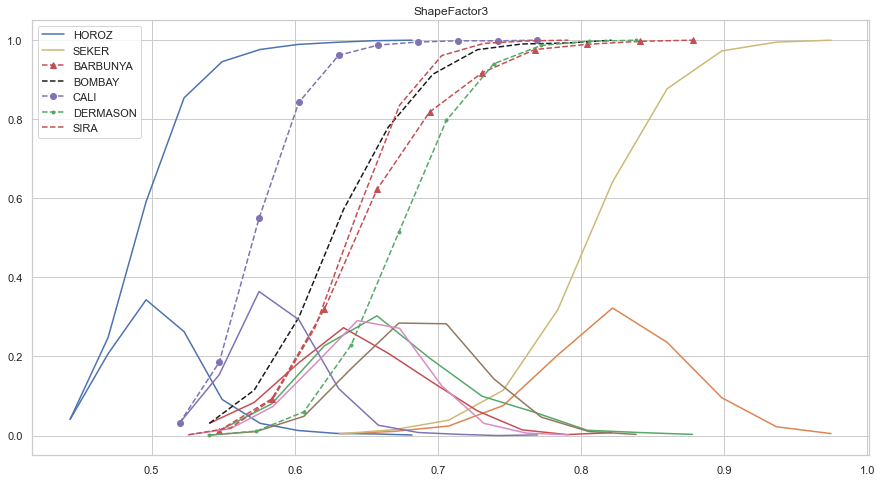

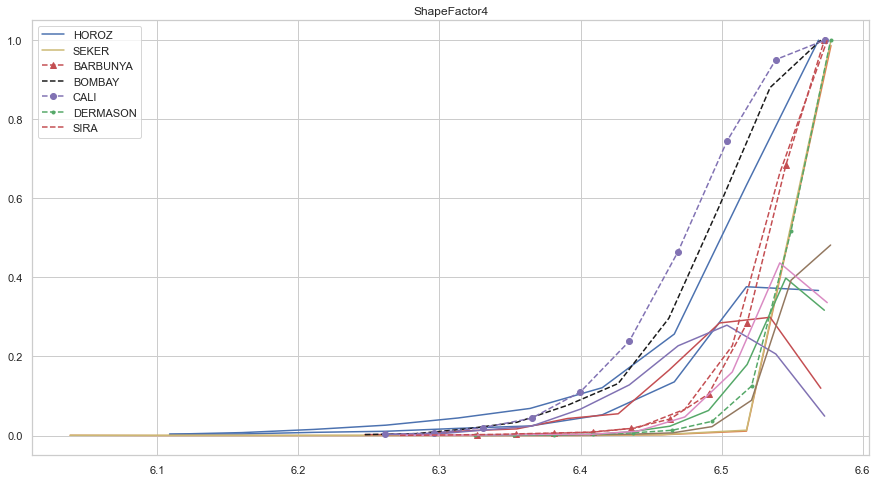

In [538]:
# Plots of CDF of petal_length for various types of y.

# Misclassification error if you use Area only.

# df_HOROZ,df_SEKER,df_BARBUNYA,df_BOMBAY,df_CALI,df_DERMASON,df_SIRA
for i in t:
    counts, bin_edges = np.histogram(df_HOROZ[i], bins=10, density = True)
    pdf = counts/(sum(counts))
    # print(pdf);
    # print(bin_edges)
    cdf = np.cumsum(pdf)
    plt.figure(figsize=(15,8))
    plt.plot(bin_edges[1:],pdf)
    plt.plot(bin_edges[1:], cdf,label='HOROZ',c='b')


    # virginica
    counts, bin_edges = np.histogram(df_SEKER[i], bins=10, density = True)
    pdf = counts/(sum(counts))
    # print(pdf);
    # print(bin_edges)
    cdf = np.cumsum(pdf)
    plt.plot(bin_edges[1:],pdf)
    plt.plot(bin_edges[1:], cdf,label='SEKER',c='y')


    #versicolor
    counts, bin_edges = np.histogram(df_BARBUNYA[i], bins=10, density = True)
    pdf = counts/(sum(counts))
    # print(pdf);
    # print(bin_edges)
    cdf = np.cumsum(pdf)
    plt.plot(bin_edges[1:],pdf)
    plt.plot(bin_edges[1:], cdf,'r--^',label='BARBUNYA')

    counts, bin_edges = np.histogram(df_BOMBAY[i], bins=10, density = True)
    pdf = counts/(sum(counts))
    # print(pdf);
    # print(bin_edges)
    cdf = np.cumsum(pdf)
    plt.plot(bin_edges[1:],pdf)
    plt.plot(bin_edges[1:], cdf,'k--',label='BOMBAY')


    # virginica
    counts, bin_edges = np.histogram(df_CALI[i], bins=10, density = True)
    pdf = counts/(sum(counts))
    # print(pdf);
    # print(bin_edges)
    cdf = np.cumsum(pdf)
    plt.plot(bin_edges[1:],pdf)
    plt.plot(bin_edges[1:], cdf,'m--o',label='CALI')


    #versicolor
    counts, bin_edges = np.histogram(df_DERMASON[i], bins=10, density = True)
    pdf = counts/(sum(counts))
    # print(pdf);
    # print(bin_edges)
    cdf = np.cumsum(pdf)
    plt.plot(bin_edges[1:],pdf)
    plt.plot(bin_edges[1:], cdf,'g.--',label='DERMASON')

    counts, bin_edges = np.histogram(df_SIRA[i], bins=10, density = True)
    pdf = counts/(sum(counts))
    # print(pdf);
    # print(bin_edges)
    cdf = np.cumsum(pdf)
    plt.plot(bin_edges[1:],pdf)
    plt.plot(bin_edges[1:], cdf,'r--',label='SIRA')
    plt.legend()
    plt.title(i)

    plt.show();

In [382]:
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import SGDClassifier
from mlxtend.classifier import StackingClassifier
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics.classification import accuracy_score, log_loss


In [404]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [1,2,3,4,5,6,7]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

In [410]:
clf = SGDClassifier(alpha=1e-05, penalty='l2', loss='log', random_state=42)
clf.fit(scaled_X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(scaled_X_train, y_train)
predict_y = sig_clf.predict_proba(X_test)

y_predict_train = sig_clf.predict(scaled_X_train)
print(accuracy_score(y_train, y_predict_train))

y_predict = sig_clf.predict(scaled_X_test)
accuracy_score(y_test, y_predict)


0.9173877927772008


0.9206275957544993

For values of alpha =  1e-05 The log loss is: 0.23653892365311943
For values of alpha =  0.0001 The log loss is: 0.23917039433244963
For values of alpha =  0.001 The log loss is: 0.26119897256067015
For values of alpha =  0.01 The log loss is: 0.3472848422618873
For values of alpha =  0.1 The log loss is: 0.497810919329585
For values of alpha =  1 The log loss is: 0.6281651858890271
For values of alpha =  10 The log loss is: 0.7200593679566493


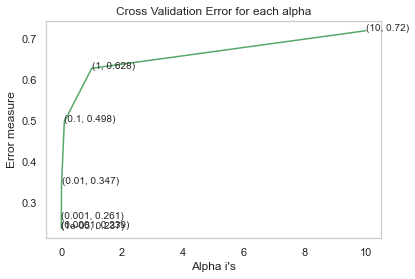

For values of best alpha =  1e-05 The train log loss is: 1.8337411474075422
For values of best alpha =  1e-05 The test log loss is: 1.8341044847963297
Total number of data points : 2167


In [409]:
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.

log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(scaled_X_train, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(scaled_X_train, y_train)
    predict_y = sig_clf.predict_proba(scaled_X_test)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train, y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
# plot_confusion_matrix(y_test, predicted_y)

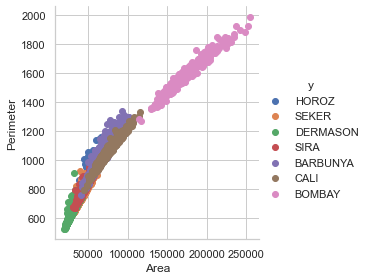

In [293]:
sns.set_style("whitegrid");
sns.FacetGrid(df, hue="y", size=4) \
   .map(plt.scatter, "Area", "Perimeter") \
   .add_legend();
plt.show();

<AxesSubplot:xlabel='Area', ylabel='y'>

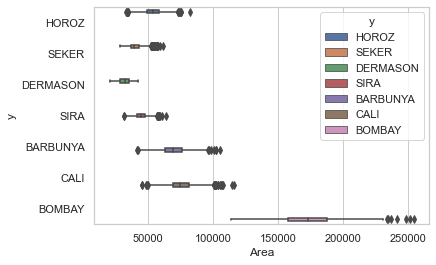

In [283]:
sns.boxplot(x='Area' ,  y='y' , hue= 'y', data=df)


In [29]:
df.y.unique()

array(['HOROZ', 'SEKER', 'DERMASON', 'SIRA', 'BARBUNYA', 'CALI', 'BOMBAY'],
      dtype=object)

In [95]:
df['y1'] = df.y.replace(['HOROZ', 'SEKER', 'DERMASON', 'SIRA', 'BARBUNYA', 'CALI', 'BOMBAY'],[1,2,3,4,5,6,7])

In [107]:
corr_matrix = df.corr(method='kendall')
corr_matrix["y1"].sort_values(ascending=False)#kendall

y1                      1.000000
MinorAxisLength         0.404105
MajorAxisLength         0.379859
ConvexArea              0.355730
Area                    0.355358
EquivDiameter           0.355358
Perimeter               0.352956
AspectRation            0.164882
Eccentricity            0.164882
Extent                  0.080199
Fourier_roundness       0.003559
Fourier_Extent         -0.002959
ID                     -0.003780
Fourier_ShapeFactor3   -0.005559
Fourier_Solidity       -0.006278
Fourier_ShapeFactor4   -0.009698
Compactness            -0.169255
ShapeFactor3           -0.169255
Solidity               -0.188432
roundness              -0.239569
ShapeFactor4           -0.261382
ShapeFactor2           -0.364399
ShapeFactor1           -0.405536
Name: y1, dtype: float64

In [108]:
corr_matrix = df.corr(method='spearman')
corr_matrix["y1"].sort_values(ascending=False)#sperman

y1                      1.000000
MinorAxisLength         0.538960
ConvexArea              0.489607
Area                    0.489087
EquivDiameter           0.489087
Perimeter               0.478586
MajorAxisLength         0.444999
Extent                  0.117541
AspectRation            0.107446
Eccentricity            0.107446
Fourier_roundness       0.004919
Fourier_Extent         -0.004092
ID                     -0.005274
Fourier_ShapeFactor3   -0.007781
Fourier_Solidity       -0.008705
Fourier_ShapeFactor4   -0.013468
Compactness            -0.111028
ShapeFactor3           -0.111028
roundness              -0.216810
Solidity               -0.242680
ShapeFactor4           -0.317894
ShapeFactor2           -0.337940
ShapeFactor1           -0.540471
Name: y1, dtype: float64

In [109]:
corr_matrix = df.corr(method='pearson')
corr_matrix["y1"].sort_values(ascending=False)#person

y1                      1.000000
MinorAxisLength         0.655305
EquivDiameter           0.625073
ConvexArea              0.617825
Area                    0.617130
Perimeter               0.597304
MajorAxisLength         0.534559
Extent                  0.204662
Eccentricity            0.151911
ID                     -0.006292
Fourier_roundness      -0.014152
Fourier_Solidity       -0.014398
Fourier_ShapeFactor4   -0.014414
Fourier_Extent         -0.014665
Fourier_ShapeFactor3   -0.014853
Compactness            -0.037108
AspectRation           -0.062415
ShapeFactor3           -0.066724
roundness              -0.124035
Solidity               -0.202784
ShapeFactor4           -0.222332
ShapeFactor2           -0.369406
ShapeFactor1           -0.625489
Name: y1, dtype: float64

<AxesSubplot:xlabel='Major_Minor', ylabel='MajorAxisLength'>

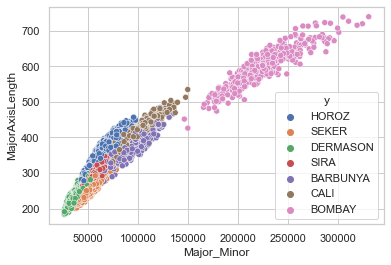

In [646]:
sns.scatterplot(df.Major_Minor,df.MajorAxisLength,hue=df.y)

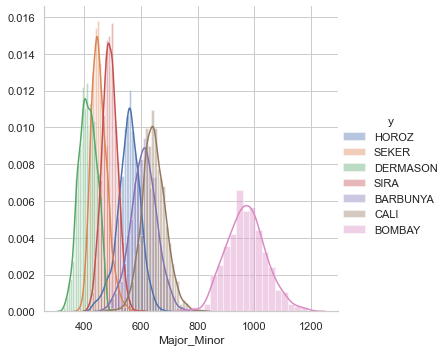

In [662]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "Major_Minor") \
   .add_legend();
plt.show();

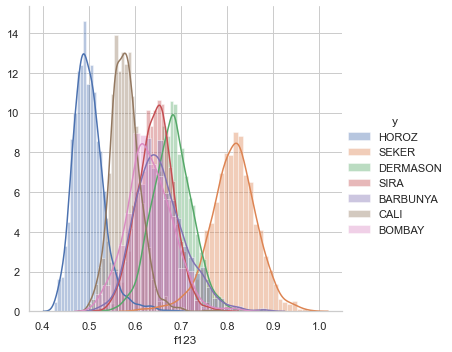

In [666]:
sns.FacetGrid(df, hue="y", size=5) \
   .map(sns.distplot, "f123") \
   .add_legend();
plt.show();

In [660]:
df['Major_Minor'] = df.MajorAxisLength + df.MinorAxisLength

In [665]:
df['f123'] = df.ShapeFactor1 + df.ShapeFactor2 + df.ShapeFactor3

In [605]:
# df['labels'] = labels

In [686]:
import plotly.express as px

In [687]:
df.columns

Index(['ID', 'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'y', 'y1', 'Major_Minor', 'f123'],
      dtype='object')

In [688]:
fig = px.line_3d(df, x="Area", y="Perimeter", z="MajorAxisLength",color = "y")
fig.show()

In [689]:
fig = px.scatter_3d(df, x="Area", y="Perimeter", z="MajorAxisLength",color = "y")
fig.show()

In [202]:
def add_features(data):
#     data['elongation']=(data['MinorAxisLength']/data['Perimeter']).round(decimals = 2)
#     data['Eccentricity']= data['Eccentricity'].round(decimals=2)
#     data['Extent']=data['Extent'].round(decimals=2)
#     data['Solidity_2']=data['Solidity'].round(decimals=2)
#     data['roundness']=data['roundness'].round(decimals=2)
#     data['Compactness']=data['Compactness'].round(decimals=2)
#     data['factors']=(data['ShapeFactor1']*data['ShapeFactor2']*data['ShapeFactor3']*data['ShapeFactor4']).round(decimals=2)
#     data['Perimeter']=data['Perimeter'].round(decimals=0)
    
    
#     data['Ar']=data['Perimeter']*data['Area']
#     data['MajorAxisLength']=data['MajorAxisLength'].round(decimals=2)
#     data['MinorAxisLength']=data['MinorAxisLength'].round(decimals=2)
#     data['EquivDiameter']=data['EquivDiameter'].round(decimals=2)
#     data['Convex_per']=2*(data['ConvexArea']*np.pi)**1/2
#     data['Convexity']=((data['Convex_per']/1000)/data['Perimeter']).round(decimals=2)
#     data['f_length']=(data['Perimeter']-((data['Perimeter'])**2-16*data['Area'])**1/2)/4
#     data['f_width']=data['Area']/data['f_length']
#     data['Curl']=data['MajorAxisLength']/data['f_length']
#     data['ShapeFactor1']=data['ShapeFactor1'].round(decimals=3)
#     data['ShapeFactor2']=data['ShapeFactor2'].round(decimals=3)
#     data['ShapeFactor3']=data['ShapeFactor3'].round(decimals=2)
#     data['ShapeFactor4']=data['ShapeFactor4'].round(decimals=2)
#     data['AspectRation']=data['AspectRation'].round(decimals=2)

    data['ShapeFactor5'] = (4*data['Area'])/(data['MinorAxisLength']*data['MinorAxisLength'])
     #resources https://en.wikipedia.org/wiki/Eccentricity_(mathematics)
    data['Second_Eccentricity'] = data['Eccentricity']/np.sqrt(1-(data['Eccentricity']**2))  
    data['Third_Eccentricity'] = data['Eccentricity']/np.sqrt(2-(data['Eccentricity']**2))
    data['Angular_Eccentricity'] = np.arcsin(data['Eccentricity'])
    
    # resources https://en.wikipedia.org/wiki/Sphericity#Ellipsoidal_objects
    a = data['MajorAxisLength']
    b = data['MinorAxisLength']
    data['Sphericity'] = (2*(a*(b**2))**(1/3))/((a)+(b**2)/((a**2)-(b**2))*np.log((((a)+((a**2)-(b**2)))/(b**2))))
    
    # not implemented https://en.wikipedia.org/wiki/Roundness_(geology)#Measure_of_roundness
    ########################################################################################
    # https://en.wikipedia.org/wiki/Curvature 
    data['Curvature_R1'] = (b*b)/a
    data['Curvature_R2'] = (a*a)/b
    # https://en.wikipedia.org/wiki/Degree_of_curvature#Formula_from_radius
    data ['Curvature_Degree_1'] = 5729.58/data['Curvature_R1']
    data ['Curvature_Degree_2'] = 5729.58/data['Curvature_R2']
    data['Perimeter']=np.log(data['Perimeter'])
    data['1st_flat']=1-(b/a)
    data['2nd_flat']=(a/b)-1
    data['3rd_flat']=(a-b)/(a+b)


    
    
    
    return data

In [218]:
df_new = add_features(df).copy()

In [204]:
df_new.head()

,ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,...,3rd_flat,elongation,Solidity_2,factors,Ar,Convex_per,Convexity,f_length,f_width,Curl
0,0,58238,1.945910,397.20,186.95,2.12,0.88,58977,272.31,0.60,...,0.359925,27.18,0.99,0.0,407666.0,185281.709931,26.47,116471.625,0.500019,0.003410
1,1,44515,1.945910,265.59,213.97,1.24,0.59,44780,238.07,0.77,...,0.107640,32.27,0.99,0.0,311605.0,140680.519028,20.10,89025.625,0.500025,0.002983
2,2,31662,1.791759,239.90,168.42,1.42,0.71,32034,200.78,0.80,...,0.175059,25.98,0.99,0.0,189972.0,100637.779065,16.77,63321.000,0.500024,0.003789
3,3,38778,1.945910,268.45,184.06,1.46,0.73,39208,222.20,0.77,...,0.186493,27.89,0.99,0.0,271446.0,123175.564762,17.60,77551.625,0.500028,0.003462
4,4,42530,1.945910,281.21,193.24,1.46,0.73,43028,232.70,0.73,...,0.185415,29.04,0.99,0.0,297710.0,135176.448699,19.31,85055.625,0.500026,0.003306


In [213]:
df.columns[0]

'ID'

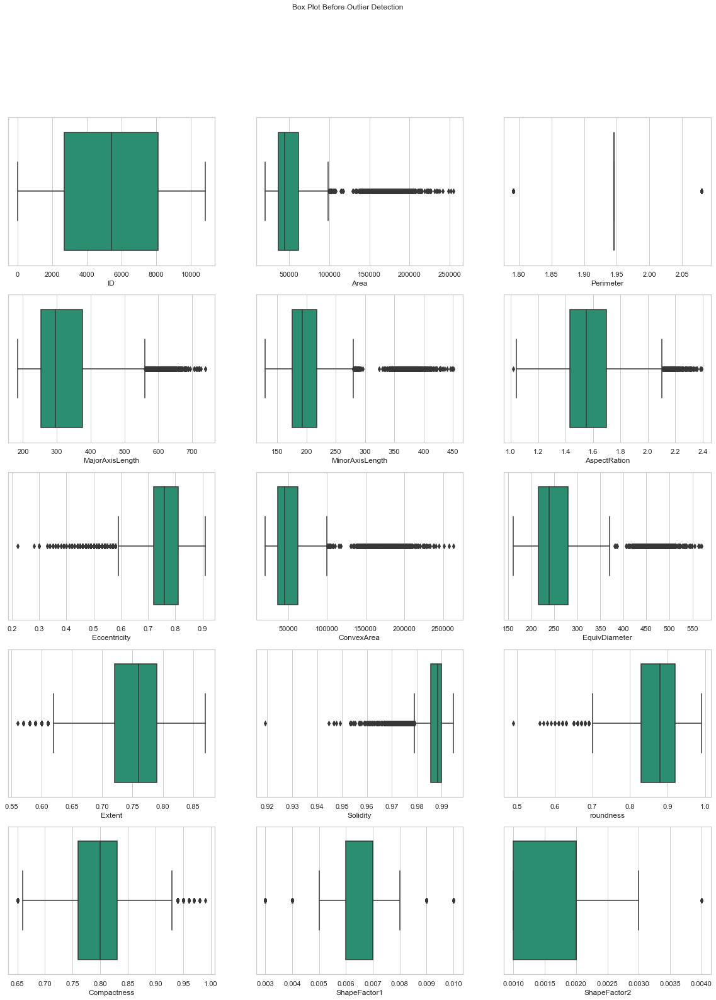

In [212]:
fig, axes = plt.subplots(5,3, figsize=(20,25))
fig.suptitle('Box Plot Before Outlier Detection')
k = 0
for i in range(0,5):
    for j in range(0,3):
        sns.boxplot(ax=axes[i,j], data=df, x=df.columns[k], palette='Dark2')
        k=k+1

In [216]:
numerical_only = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4']

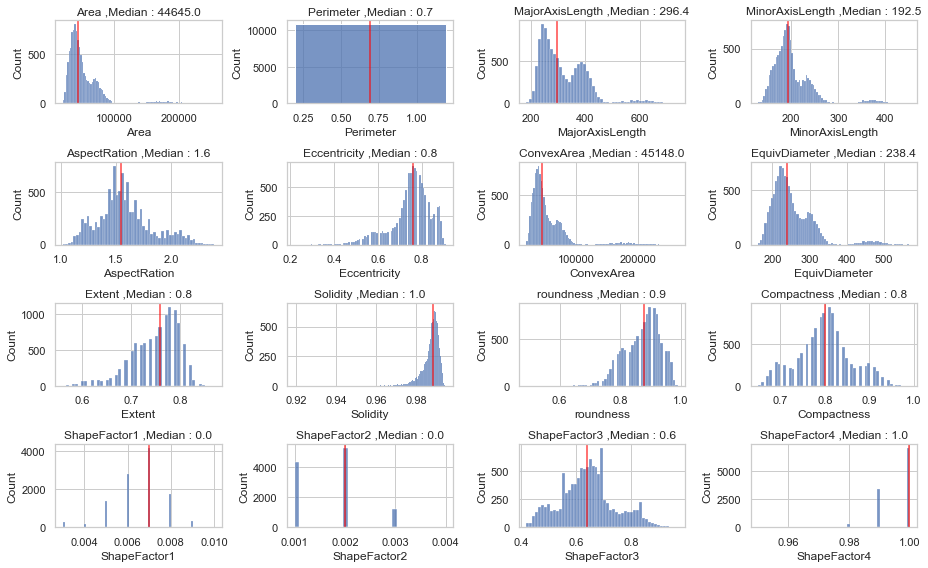

In [220]:
fig,axes = plt.subplots(4,4,figsize=(13,8))
for i,axe in enumerate(axes.flatten()):
    sns.histplot(df[numerical_only[i]],ax=axe)
    median = df[numerical_only[i]].median()
    axe.set_title(numerical_only[i] + f' ,Median : {median:0.1f}')
    axe.axvline(median, color ='red',lw=2, alpha = 0.55)
plt.tight_layout()
plt.show()

In [225]:
# fig,axes = plt.subplots(4,4,figsize=(13,8))
# for i,axe in enumerate(axes.flatten()):
#     sns.boxplot(data=df[numerical_only[i]],ax=axe)
#     axe.set_title(numerical_only[i])
    
# plt.tight_layout()
# plt.show()

In [224]:
# for i in numerical_only:
    
#     plt.scatter(x = 'y', y = i, data = df)
#     # Create title, xlabel and ylabel
#     plt.title(i)
#     plt.xlabel('y')
#     plt.ylabel(i)
#     # Show plot
#     plt.show()


In [ ]:
# df["Humidity_ap"] = pd.Series(np.where(df.Humidity < 58, "Hum_increase", "Hum_decrease"))

In [223]:
df.columns

Index(['ID', 'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'y', 'ShapeFactor5',
       'Second_Eccentricity', 'Third_Eccentricity', 'Angular_Eccentricity',
       'Sphericity', 'Curvature_R1', 'Curvature_R2', 'Curvature_Degree_1',
       'Curvature_Degree_2', '1st_flat', '2nd_flat', '3rd_flat', 'elongation',
       'Solidity_2', 'factors', 'Ar', 'Convex_per', 'Convexity', 'f_length',
       'f_width', 'Curl'],
      dtype='object')

In [ ]:
# plt.figure(figsize=(10,10))
fig, axes = plt.subplots(1,2)
plt.tight_layout(0.2)

print("Before Shape:",df.shape)
## Removing humidity bellow 0 outliers
df2 = df[(df['MajorAxisLength']<700)]
print("After Shape:",df2.shape)

sns.boxplot(df['MajorAxisLength'],orient='v',ax=axes[0])
axes[0].title.set_text("Before")
sns.boxplot(df2['MajorAxisLength'],orient='v',ax=axes[1])
axes[1].title.set_text("After")
plt.show()
# Replace new dataset with previous and resetting indexes
# df=df2;
# df=df.reset_index(drop=True)

Before Shape: (10834, 39)
After Shape: (10821, 39)


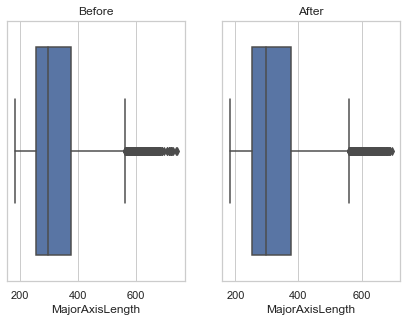

In [246]:
# plt.figure(figsize=(10,10))
fig, axes = plt.subplots(1,2)
plt.tight_layout(0.2)

print("Before Shape:",df.shape)
## Removing humidity bellow 0 outliers
df2 = df[(df['MajorAxisLength']<700)]
print("After Shape:",df2.shape)

sns.boxplot(df['MajorAxisLength'],orient='v',ax=axes[0])
axes[0].title.set_text("Before")
sns.boxplot(df2['MajorAxisLength'],orient='v',ax=axes[1])
axes[1].title.set_text("After")
plt.show()
# Replace new dataset with previous and resetting indexes
# df=df2;
# df=df.reset_index(drop=True)

Before Shape: (10834, 39)
After Shape: (0, 39)


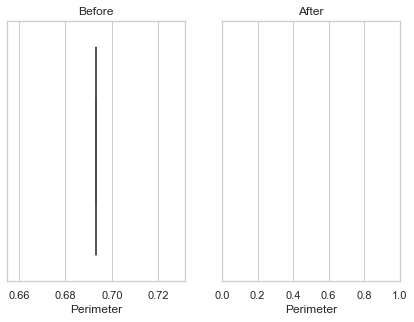

In [245]:
# plt.figure(figsize=(10,10))
fig, axes = plt.subplots(1,2)
plt.tight_layout(0.2)

print("Before Shape:",df.shape)
## Removing humidity bellow 0 outliers
df2 = df[((df['Perimeter']<2) & (df['Perimeter']>1.8) )]
print("After Shape:",df2.shape)

sns.boxplot(df['Perimeter'],orient='v',ax=axes[0])
axes[0].title.set_text("Before")
sns.boxplot(df2['Perimeter'],orient='v',ax=axes[1])
axes[1].title.set_text("After")
plt.show()
# Replace new dataset with previous and resetting indexes
# df=df2;
# df=df.reset_index(drop=True)

Before Shape: (10834, 39)
After Shape: (10830, 39)


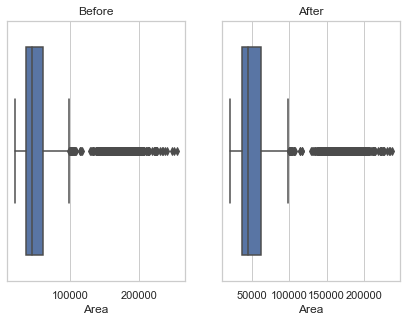

In [240]:
# plt.figure(figsize=(10,10))
fig, axes = plt.subplots(1,2)
plt.tight_layout(0.2)

print("Before Shape:",df.shape)
## Removing humidity bellow 0 outliers
df2 = df[(df['Area']<240000)]
print("After Shape:",df2.shape)

sns.boxplot(df['Area'],orient='v',ax=axes[0])
axes[0].title.set_text("Before")
sns.boxplot(df2['Area'],orient='v',ax=axes[1])
axes[1].title.set_text("After")
plt.show()
# Replace new dataset with previous and resetting indexes
# df=df2;
# df=df.reset_index(drop=True)

In [ ]:
print(len(df))
UpperLimit = df['Rainfall'].mean() + df['Rainfall'].std() * .25
LowerLimit = df['Rainfall'].mean() - df['Rainfall'].std() * .25
df2 = df[(df['Rainfall'] < UpperLimit) & (df['Rainfall'] > LowerLimit)]
print(len(df2))
# UpperLimit = df['Rainfall'].quantile(0.95)
# LowerLimit = df['Rainfall'].quantile(0.05)
# df3 = df[(df['Rainfall'] < UpperLimit) & (df['Rainfall'] > LowerLimit)]
# print(len(df3))

fig, axes = plt.subplots(1,2)
plt.tight_layout(0.2)
sns.boxplot(df['Rainfall'],orient='v',ax=axes[0])
axes[0].title.set_text("Before")
sns.boxplot(df2['Rainfall'],orient='v',ax=axes[1])
axes[1].title.set_text("After")
plt.show()

# df=df2;
# df=df.reset_index(drop=True)

In [ ]:
# create columns variables to hold the columns that need transformation
columns = ['Wind_speed']

# create the function transformer object with logarithm transformation
logarithm_transformer1 = FunctionTransformer(np.log1p, validate=True)

# apply the transformation 
data_new = logarithm_transformer1.transform(df[columns])
df_new = pd.DataFrame(data_new, columns=columns)

# replace new values with previous data frame
df['Wind_speed']=df_new['Wind_speed']

In [ ]:
# After transformation
stats.probplot(df["Wind_speed"], dist="norm", plot=plt);
plt.show();
df["Wind_speed"].hist(bins=20);

In [ ]:
## Visibility. - X_train
stats.probplot(df["Visibility"], dist="norm", plot=plt);
plt.show();
df["Visibility"].hist(bins=20);

In [ ]:
# create columns variables to hold the columns that need transformation
columns = ['Visibility']

# create the function transformer object with exponentioal transformation
exp_transformer2 = FunctionTransformer(lambda x:x**3, validate=True)

# apply the transformation 
data_new = exp_transformer2.transform(df[columns])
df_new = pd.DataFrame(data_new, columns=columns)
df_new['Visibility'].hist(bins=20)

# replace new values with previous data frame
df["Visibility"]=df_new['Visibility']

In [ ]:
stats.probplot(df_new["Visibility"], dist="norm", plot=plt);

In [ ]:
# Make an instance of the Model
pca = PCA()
pca.fit(df) 

X_train_pca = pca.transform(df)

X_train_pca_df = pd.DataFrame(data = X_train_pca,columns=df.columns)

# X_train_pca_df.head()
# X_train_pca_df.shape

# Lambda values (Eigon values)
explained_variance_ratio=pca.explained_variance_ratio_
explained_variance_ratio

# plt.plot(range(21), pca.explained_variance_ratio_)
# plt.plot(range(21), np.cumsum(pca.explained_variance_ratio_)) # Cummualtive frequency graph
# plt.title("Component-wise and Cumulative Explained Variance")

arr=explained_variance_ratio 
sum = 0;  
for i in range(0, 3):    
    sum=sum+arr[i]   
print("Sum :" + str(sum));  

pca = PCA(n_components=3)
pca.fit(df) 

X_train_pca = pca.transform(df)


In [606]:
from sklearn.feature_selection import SelectPercentile, chi2

In [205]:
X = df_new.drop(columns=['ID','y'])

y = df['y']

In [206]:
X.shape

(10834, 37)

In [138]:
scaler = StandardScaler()
scaler.fit(X)
StandardScaler(copy=True, with_mean=True, with_std=True)
X_scaled = scaler.transform(X)


In [391]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters=7)
model.fit(X)

labels = model.predict(X)
print(labels)
# print(model.inertia_)


[3 4 0 ... 1 3 0]


In [392]:
len(labels)

10834

In [219]:
kmean_df = pd.DataFrame({'labels': labels,'species': y})
print(kmean_df.head())

   labels  species
0       0        1
1       5        2
2       2        3
3       5        3
4       5        4


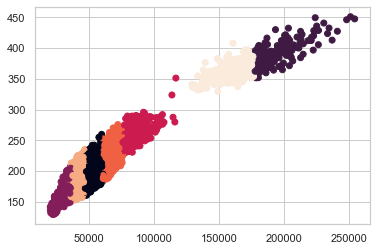

In [222]:
xs = X.iloc[:,0]
ys = X.iloc[:,3]
plt.scatter(xs, ys, c=labels)
plt.show()

In [220]:
ct = pd.crosstab(kmean_df['labels'], kmean_df['species'])
print(ct)

species     1     2     3     4    5    6    7
labels                                        
0        1015   126     0   613  191   55    0
1           0     0     0     0    0    0  177
2          19   384  2232    55    0    0    0
3           1     0     0     0  257  541    2
4         221     1     0     1  599  706    0
5         232  1110   605  1440   10    2    0
6           0     0     0     0    0    0  239


In [428]:
df.y.unique()

array(['HOROZ', 'SEKER', 'DERMASON', 'SIRA', 'BARBUNYA', 'CALI', 'BOMBAY'],
      dtype=object)

In [467]:
from sklearn.cluster import AffinityPropagation

from numpy import unique
from numpy import where
from sklearn.cluster import AgglomerativeClustering ,Birch ,DBSCAN ,MiniBatchKMeans \
,MeanShift ,OPTICS ,SpectralClustering ,GaussianMixture


model = GaussianMixture(n_components=2)#fast
# fit the model
model.fit(X)
# assign a cluster to each example
yhat = model.predict(X)
# retrieve unique clusters
clusters = unique(yhat)

# model = SpectralClustering(n_clusters=2)#slow
# # fit model and predict clusters
# yhat = model.fit_predict(X)
# # retrieve unique clusters
# clusters = unique(yhat)

# model = OPTICS(eps=0.8, min_samples=10)#slow
# # fit model and predict clusters
# yhat = model.fit_predict(X)
# # retrieve unique clusters
# clusters = unique(yhat)

# model = MeanShift()#slow
# # fit model and predict clusters
# yhat = model.fit_predict(X)
# # retrieve unique clusters
# clusters = unique(yhat)

# model = MiniBatchKMeans(n_clusters=2)
# # fit the model
# model.fit(X)
# # assign a cluster to each example
# yhat = model.predict(X)
# # retrieve unique clusters
# clusters = unique(yhat)

# model = AgglomerativeClustering(n_clusters=2)
# # fit model and predict clusters
# yhat = model.fit_predict(X)
# # retrieve unique clusters
# clusters = unique(yhat)

# model = AffinityPropagation(damping=0.9)
# # fit the model
# model.fit(X)
# # assign a cluster to each example
# yhat = model.predict(X)
# # # retrieve unique clusters
# # clusters = unique(yhat)

# model = DBSCAN(eps=0.30, min_samples=9)#slow
# # fit model and predict clusters
# yhat = model.fit_predict(X)
# # retrieve unique clusters
# clusters = unique(yhat)

# model = Birch(threshold=0.01, n_clusters=2)#
# # fit the model
# model.fit(X)
# # assign a cluster to each example
# yhat = model.predict(X)
# # retrieve unique clusters
# clusters = unique(yhat)

# model = KMeans(n_clusters=2)#fast
# # fit the model
# model.fit(X)
# # assign a cluster to each example
# yhat = model.predict(X)
# # retrieve unique clusters
# clusters = unique(yhat)

# create scatter plot for samples from each cluster
# for cluster in clusters:
#     row_ix = where(yhat == cluster)
# # create scatter of these samples
#     pyplot.scatter(X[row_ix, 0], X[row_ix, 1])
# # show the plot
# pyplot.show()

   yhat        yA
0     0     HOROZ
1     0     SEKER
2     0  DERMASON
3     0  DERMASON
4     0      SIRA


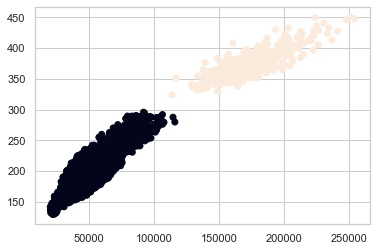

In [468]:
Aggl_df = pd.DataFrame({'yhat': yhat,'yA': y})
print(Aggl_df.head())

xs = X.iloc[:,0]
ys = X.iloc[:,3]
plt.scatter(xs, ys, c=yhat)
plt.show()

In [577]:
df.y.value_counts(normalize=True)

DERMASON    0.261861
SIRA        0.194665
SEKER       0.149622
HOROZ       0.137345
CALI        0.120362
BARBUNYA    0.097563
BOMBAY      0.038582
Name: y, dtype: float64

In [578]:
# X_new = SelectPercentile(chi2, percentile=10).fit_transform(X, y)

In [207]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42,stratify=y)

In [208]:
# tpot = TPOTClassifier(generations=5, population_size=50, verbosity=2)
# tpot.fit(X_train, y_train)
# print(tpot.score(X_test, y_test))
# tpot.export('tpot_digits_pipeline.py')

In [209]:
y_train.value_counts(normalize=True)

DERMASON    0.261785
SIRA        0.194708
SEKER       0.149662
HOROZ       0.137354
CALI        0.120369
BARBUNYA    0.097600
BOMBAY      0.038523
Name: y, dtype: float64

In [210]:
scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [188]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE,SVMSMOTE,ADASYN
from sklearn.model_selection import RepeatedStratifiedKFold

In [189]:
steps = [('over', ADASYN()), ('model', SVC())]
pipeline = Pipeline(steps=steps)
# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(pipeline, scaled_X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1)
print('Mean ROC AUC: %.3f' % np.mean(scores))

Mean ROC AUC: nan


In [211]:
## try Logistic Regression
logis_clf = LogisticRegression(random_state=42, n_jobs=-1, C=10, max_iter=7000)
logis_clf.fit(scaled_X_train, y_train)

y_predict_train = logis_clf.predict(scaled_X_train)
print(accuracy_score(y_train, y_predict_train))

y_predict = logis_clf.predict(scaled_X_test)
accuracy_score(y_test, y_predict)

0.9196307692307693


0.9239571797711332

In [144]:
## try Logistic Regression
logis_clf = LogisticRegression(random_state=42, n_jobs=-1, C=10, max_iter=7000)
logis_clf.fit(X_train, y_train)

y_predict = logis_clf.predict(X_test)
accuracy_score(y_test, y_predict)

0.9136212624584718

In [132]:
y_scores_cross = cross_val_score(logis_clf, X_train, y_train, cv=10, scoring='accuracy', n_jobs=-1)

y_predict_cross = cross_val_predict(logis_clf, X_train, y_train, cv=10, method='predict', n_jobs=-1)

accuracy_model = accuracy_score(y_train, y_predict_cross)
precesion_model = precision_score(y_train, y_predict_cross, average="macro")
recall_model = recall_score(y_train, y_predict_cross, average="macro")

print(f'accuracy_model: {accuracy_model} , precesion_model: {precesion_model} , recall_model: {recall_model}')

accuracy_model: 0.9214260989961924 , precesion_model: 0.9355958227887189 , recall_model: 0.9330669561606697


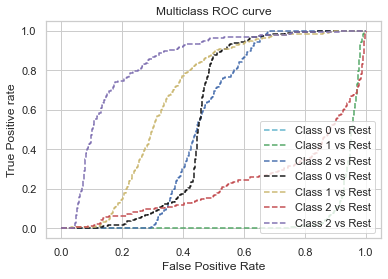

In [72]:
clf = OneVsRestClassifier(LogisticRegression())
clf.fit(X_train, y_train)
pred = clf.predict(X_test)
pred_prob = clf.predict_proba(X_test)

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 7

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, pred_prob[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='c', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='g', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='b', label='Class 2 vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='k', label='Class 0 vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='y', label='Class 1 vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='r', label='Class 2 vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='m', label='Class 2 vs Rest')

plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);

In [355]:
df.y.value_counts(normalize=True)

DERMASON    0.261861
SIRA        0.194665
SEKER       0.149622
HOROZ       0.137345
CALI        0.120362
BARBUNYA    0.097563
BOMBAY      0.038582
Name: y, dtype: float64

In [403]:
df.labels.value_counts()

4    3393
0    2604
3    2040
5    1547
1     834
2     240
6     176
Name: labels, dtype: int64

In [356]:
weight = {'BOMBAY':0.261861,'BARBUNYA':0.194665,'CALI':0.149622,'HOROZ':0.137345,'SEKER':0.120362,'SIRA':0.097563,'DERMASON':0.038582}

In [201]:
SVC_ = SVC(random_state=42,C= 20, gamma= 0.02, kernel= 'rbf',probability=True)
SVC_.fit(scaled_X_train, y_train)

y_predict_train = SVC_.predict(scaled_X_train)
print(accuracy_score(y_predict_train, y_train))

y_predict = SVC_.predict(scaled_X_test)
print(accuracy_score(y_test, y_predict))

0.9331692307692308
0.9357696566998892


In [618]:
print(confusion_matrix(y_test,y_predict))
print(classification_report(y_test,y_predict))

[[242   0  15   0   2   1   4]
 [  0 105   0   0   0   0   0]
 [  6   0 314   0   4   0   2]
 [  0   0   0 665   0   5  40]
 [  2   0   3   5 354   0   8]
 [  2   0   0   6   0 385  12]
 [  2   0   3  46   1   3 472]]
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.92      0.93       264
      BOMBAY       1.00      1.00      1.00       105
        CALI       0.94      0.96      0.95       326
    DERMASON       0.92      0.94      0.93       710
       HOROZ       0.98      0.95      0.97       372
       SEKER       0.98      0.95      0.96       405
        SIRA       0.88      0.90      0.89       527

    accuracy                           0.94      2709
   macro avg       0.95      0.94      0.95      2709
weighted avg       0.94      0.94      0.94      2709



In [553]:
labels=['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']

In [619]:
SVC_.classes_

array(['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'],
      dtype=object)

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'BARBUNYA'),
  Text(0, 1.5, 'BOMBAY'),
  Text(0, 2.5, 'CALI'),
  Text(0, 3.5, 'DERMASON'),
  Text(0, 4.5, 'HOROZ'),
  Text(0, 5.5, 'SEKER'),
  Text(0, 6.5, 'SIRA')])

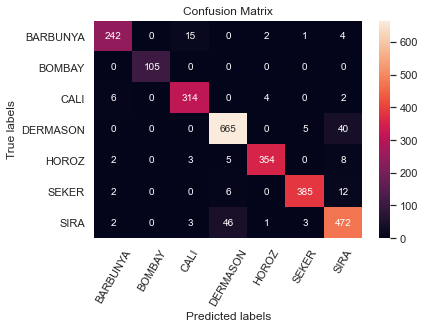

In [620]:
cm = confusion_matrix(y_test,y_predict)
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels); 
ax.yaxis.set_ticklabels(labels,);
plt.xticks(rotation=60)
plt.yticks(rotation=0)

In [354]:
df.y.unique()

array(['HOROZ', 'SEKER', 'DERMASON', 'SIRA', 'BARBUNYA', 'CALI', 'BOMBAY'],
      dtype=object)

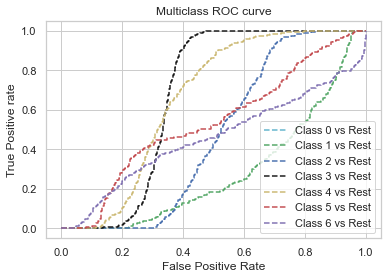

In [67]:
SVC_ = SVC(random_state=42,C= 5, gamma= 0.1, kernel= 'rbf',probability=True)
SVC_.fit(scaled_X_train, y_train)

y_predict_train = SVC_.predict(scaled_X_train)

pred = SVC_.predict(scaled_X_test)
pred_prob = SVC_.predict_proba(scaled_X_test)

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 7

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, pred_prob[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='c', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='g', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='b', label='Class 2 vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='k', label='Class 3 vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='y', label='Class 4 vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='r', label='Class 5 vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='m', label='Class 6 vs Rest')

plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);

In [31]:
SVC_ = SVC(random_state=42)
SVC_.fit(X_train, y_train)

y_predict = SVC_.predict(X_test)
accuracy_score(y_test, y_predict)

0.6372865712967236

In [59]:
y_scores_cross = cross_val_score(SVC_, X_train, y_train, cv=10, scoring='accuracy', n_jobs=-1)

y_predict_cross = cross_val_predict(SVC_, X_train, y_train, cv=10, method='predict', n_jobs=-1)

accuracy_model = accuracy_score(y_train, y_predict_cross)
precesion_model = precision_score(y_train, y_predict_cross, average="macro")
recall_model = recall_score(y_train, y_predict_cross, average="macro")

print(f'accuracy_model: {accuracy_model} , precesion_model: {precesion_model} , recall_model: {recall_model}')

accuracy_model: 0.2620283835237106 , precesion_model: 0.18026975333069517 , recall_model: 0.1430144987731285


In [ ]:
from scipy.stats import expon, reciprocal

# see https://docs.scipy.org/doc/scipy/reference/stats.html
# for `expon()` and `reciprocal()` documentation and more probability distribution functions.

# Note: gamma is ignored when kernel is "linear"
param_distribs = {
        'kernel': ['linear', 'rbf'],
        'C': reciprocal(20, 200000),
        'gamma': expon(scale=1.0),
    }

rnd_search = RandomizedSearchCV(SVC_, param_distributions=param_distribs,
                                n_iter=50, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

In [ ]:
rnd_search.best_score_
rnd_search.best_params_

In [72]:
LinearSVC_ = LinearSVC()
LinearSVC_.fit(scaled_X_train, y_train)

y_predict = LinearSVC_.predict(scaled_X_test)
accuracy_score(y_test, y_predict)

0.9137055837563451

In [84]:
from sklearn.metrics import roc_auc_score

In [57]:
KNN = KNeighborsClassifier(n_neighbors=7,leaf_size=5,p=1)
KNN.fit(scaled_X_train, y_train)

y_predict_train = KNN.predict(scaled_X_train)
print(accuracy_score(y_predict_train, y_train))

y_predict = KNN.predict(scaled_X_test)
print(accuracy_score(y_test, y_predict))
y_predict_prop = KNN.predict_proba(scaled_X_test)

print(roc_auc_score(y_test, y_predict_prop,multi_class='ovr', average = 'macro'))

print(confusion_matrix(y_test,y_predict))
print(classification_report(y_test,y_predict))

0.936656282450675
0.9215505306875865
0.9880748123659016
[[287   0   2   5   2   2   0]
 [  0 308   5   9   2   0   0]
 [  1   8 516  42   0   0   0]
 [  6   0  44 370   2   0   0]
 [  1   2   0   3 188  17   0]
 [  6   0   0   4   7 244   0]
 [  0   0   0   0   0   0  84]]
              precision    recall  f1-score   support

           1       0.95      0.96      0.96       298
           2       0.97      0.95      0.96       324
           3       0.91      0.91      0.91       567
           4       0.85      0.88      0.87       422
           5       0.94      0.89      0.91       211
           6       0.93      0.93      0.93       261
           7       1.00      1.00      1.00        84

    accuracy                           0.92      2167
   macro avg       0.94      0.93      0.93      2167
weighted avg       0.92      0.92      0.92      2167



In [136]:
y_scores_cross = cross_val_score(KNN, X_train, y_train, cv=10, scoring='accuracy', n_jobs=-1)

y_predict_cross = cross_val_predict(KNN, X_train, y_train, cv=10, method='predict', n_jobs=-1)

accuracy_model = accuracy_score(y_train, y_predict_cross)
precesion_model = precision_score(y_train, y_predict_cross, average="macro")
recall_model = recall_score(y_train, y_predict_cross, average="macro")

print(f'accuracy_model: {accuracy_model} , precesion_model: {precesion_model} , recall_model: {recall_model}')

accuracy_model: 0.9157724702896043 , precesion_model: 0.9319048424244939 , recall_model: 0.9273562324565654


In [58]:
GB = GradientBoostingClassifier()
GB.fit(X_train, y_train)

y_predict_train = GB.predict(X_train)
print(accuracy_score(y_predict_train, y_train))

y_predict = GB.predict(X_test)
print(accuracy_score(y_test, y_predict))
y_predict_prop = GB.predict_proba(X_test)

print(roc_auc_score(y_test, y_predict_prop,multi_class='ovr', average = 'macro'))

print(confusion_matrix(y_test,y_predict))
print(classification_report(y_test,y_predict))

0.9646936656282451
0.9229349330872173
0.9940761333964776
[[288   0   2   6   0   2   0]
 [  0 307   6   7   4   0   0]
 [  1   5 518  40   2   1   0]
 [  3   3  48 367   1   0   0]
 [  2   2   0   3 192  12   0]
 [  7   0   0   2   8 244   0]
 [  0   0   0   0   0   0  84]]
              precision    recall  f1-score   support

           1       0.96      0.97      0.96       298
           2       0.97      0.95      0.96       324
           3       0.90      0.91      0.91       567
           4       0.86      0.87      0.87       422
           5       0.93      0.91      0.92       211
           6       0.94      0.93      0.94       261
           7       1.00      1.00      1.00        84

    accuracy                           0.92      2167
   macro avg       0.94      0.93      0.94      2167
weighted avg       0.92      0.92      0.92      2167



In [138]:
y_scores_cross = cross_val_score(GB, X_train, y_train, cv=10, scoring='accuracy', n_jobs=-1)

y_predict_cross = cross_val_predict(GB, X_train, y_train, cv=10, method='predict', n_jobs=-1)

accuracy_model = accuracy_score(y_train, y_predict_cross)
precesion_model = precision_score(y_train, y_predict_cross, average="macro")
recall_model = recall_score(y_train, y_predict_cross, average="macro")

print(f'accuracy_model: {accuracy_model} , precesion_model: {precesion_model} , recall_model: {recall_model}')

accuracy_model: 0.9218876197069343 , precesion_model: 0.9359673345625605 , recall_model: 0.9321482085731981


In [59]:
BG = BaggingClassifier()
BG.fit(X_train, y_train)

y_predict = BG.predict(X_test)
accuracy_score(y_test, y_predict)

0.906783571758191

In [ ]:
y_scores_cross = cross_val_score(BG, X_train, y_train, cv=10, scoring='accuracy', n_jobs=-1)

y_predict_cross = cross_val_predict(BG, X_train, y_train, cv=10, method='predict', n_jobs=-1)

accuracy_model = accuracy_score(y_train, y_predict_cross)
precesion_model = precision_score(y_train, y_predict_cross, average="macro")
recall_model = recall_score(y_train, y_predict_cross, average="macro")

print(f'accuracy_model: {accuracy_model} , precesion_model: {precesion_model} , recall_model: {recall_model}')

In [60]:
AB = AdaBoostClassifier()
AB.fit(X_train, y_train)

y_predict = AB.predict(X_test)
accuracy_score(y_test, y_predict)

0.687586525149977

In [61]:
DT = DecisionTreeClassifier()
DT.fit(X_train, y_train)

y_predict = DT.predict(X_test)
accuracy_score(y_test, y_predict)

0.8906322104291647

In [62]:
GNB = GaussianNB()
GNB.fit(X_train, y_train)

y_predict = GNB.predict(X_test)
accuracy_score(y_test, y_predict)

0.7591139824642362

In [65]:
random_forest = RandomForestClassifier(random_state=42)
random_forest.fit(X_train, y_train)

y_predict_train = random_forest.predict(X_train)
print(accuracy_score(y_predict_train, y_train))

y_predict = random_forest.predict(X_test)
accuracy_score(y_test, y_predict)

1.0


0.9229349330872173

In [151]:
param_grid = {"n_estimators":[50,100,200,300,500,1000],'max_depth':[3,4,5,6]}

grid_model = GridSearchCV(random_forest, param_grid)

# fit the grid model
grid_model.fit(X_train, y_train)

preds = grid_model.predict(X_test)

# print accuracy score 
print(accuracy_score(y_test,preds))

# plot confusion matrix
fig, ax = plt.subplots(figsize=(6, 6), dpi = 100)
plot_confusion_matrix(grid_model, X_test, y_test, ax = ax);

In [ ]:
weights = pd.Series(random_forest.coef_[0],
                 index=X.columns.values)
print (weights.sort_values(ascending = False)[:10].plot(kind='bar'))

In [ ]:
print(weights.sort_values(ascending = False)[-10:].plot(kind='bar'))

In [ ]:
y_scores_cross = cross_val_score(random_forest, X_train, y_train, cv=10, scoring='accuracy', n_jobs=-1)

y_predict_cross = cross_val_predict(random_forest, X_train, y_train, cv=10, method='predict', n_jobs=-1)

accuracy_model = accuracy_score(y_train, y_predict_cross)
precesion_model = precision_score(y_train, y_predict_cross, average="macro")
recall_model = recall_score(y_train, y_predict_cross, average="macro")

print(f'accuracy_model: {accuracy_model} , precesion_model: {precesion_model} , recall_model: {recall_model}')

In [508]:
best_params_lgb_huber = {
    "objective": "huber",
    "boosting": "gbdt",
    "verbosity": -1,
    "num_leaves": 12,
    "min_data_in_leaf": 40,
    "max_depth": 8,
    "learning_rate": 0.005,
    "bagging_freq": 4,
    "bagging_fraction": 0.6,
    "bagging_seed": 11,
    "random_seed": 19,
    "metric": "mae",
    "reg_alpha": 0.47777777777777775,
    "reg_lambda": 0.47777777777777775
}

In [509]:
XGB = XGBClassifier(best_params_lgb_huber)
XGB.fit(X_train, y_train)

y_predict = XGB.predict(X_test)
accuracy_score(y_test, y_predict)

[09:41:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.9243193354868482

In [503]:
best_params={
#     'bagging_temperature': 0.41010395885331385,
#  'border_count': 186,
 'depth': 8,
#  'iterations': 1000,
 'l2_leaf_reg': 21,
 'learning_rate': 0.0673344419215237,
#  'random_strength': 3.230824361824754e-06,
#  'scale_pos_weight': 0.7421091918485163
            }

In [507]:
CatB = CatBoostClassifier(learning_rate= 0.05,depth= 8,l2_leaf_reg = 21,n_estimator =1500)
CatB.fit(X_train, y_train)

y_predict = CatB.predict(X_test)
accuracy_score(y_test, y_predict)

0:	learn: 1.7748506	total: 79.7ms	remaining: 1m 19s
1:	learn: 1.6438816	total: 160ms	remaining: 1m 19s
2:	learn: 1.5247591	total: 222ms	remaining: 1m 13s
3:	learn: 1.4388283	total: 285ms	remaining: 1m 10s
4:	learn: 1.3479472	total: 363ms	remaining: 1m 12s
5:	learn: 1.2721242	total: 426ms	remaining: 1m 10s
6:	learn: 1.2035368	total: 487ms	remaining: 1m 9s
7:	learn: 1.1410778	total: 567ms	remaining: 1m 10s
8:	learn: 1.0825425	total: 638ms	remaining: 1m 10s
9:	learn: 1.0309830	total: 709ms	remaining: 1m 10s
10:	learn: 0.9886410	total: 784ms	remaining: 1m 10s
11:	learn: 0.9473999	total: 856ms	remaining: 1m 10s
12:	learn: 0.9093247	total: 937ms	remaining: 1m 11s
13:	learn: 0.8751767	total: 1.02s	remaining: 1m 11s
14:	learn: 0.8432536	total: 1.1s	remaining: 1m 12s
15:	learn: 0.8114762	total: 1.17s	remaining: 1m 12s
16:	learn: 0.7820274	total: 1.25s	remaining: 1m 12s
17:	learn: 0.7555579	total: 1.33s	remaining: 1m 12s
18:	learn: 0.7293466	total: 1.41s	remaining: 1m 12s
19:	learn: 0.7061049	to

159:	learn: 0.2198993	total: 12.4s	remaining: 1m 4s
160:	learn: 0.2195988	total: 12.5s	remaining: 1m 4s
161:	learn: 0.2192008	total: 12.5s	remaining: 1m 4s
162:	learn: 0.2186842	total: 12.6s	remaining: 1m 4s
163:	learn: 0.2183007	total: 12.7s	remaining: 1m 4s
164:	learn: 0.2176923	total: 12.8s	remaining: 1m 4s
165:	learn: 0.2172574	total: 12.9s	remaining: 1m 4s
166:	learn: 0.2168410	total: 12.9s	remaining: 1m 4s
167:	learn: 0.2165351	total: 13s	remaining: 1m 4s
168:	learn: 0.2162285	total: 13.1s	remaining: 1m 4s
169:	learn: 0.2158166	total: 13.2s	remaining: 1m 4s
170:	learn: 0.2154660	total: 13.2s	remaining: 1m 4s
171:	learn: 0.2151577	total: 13.3s	remaining: 1m 4s
172:	learn: 0.2147805	total: 13.4s	remaining: 1m 4s
173:	learn: 0.2144128	total: 13.5s	remaining: 1m 4s
174:	learn: 0.2140532	total: 13.6s	remaining: 1m 3s
175:	learn: 0.2137578	total: 13.7s	remaining: 1m 3s
176:	learn: 0.2134102	total: 13.7s	remaining: 1m 3s
177:	learn: 0.2130956	total: 13.8s	remaining: 1m 3s
178:	learn: 0.

320:	learn: 0.1853299	total: 26.9s	remaining: 57s
321:	learn: 0.1852586	total: 27s	remaining: 56.9s
322:	learn: 0.1851319	total: 27.1s	remaining: 56.8s
323:	learn: 0.1850014	total: 27.2s	remaining: 56.7s
324:	learn: 0.1849041	total: 27.2s	remaining: 56.6s
325:	learn: 0.1848054	total: 27.3s	remaining: 56.5s
326:	learn: 0.1847160	total: 27.4s	remaining: 56.4s
327:	learn: 0.1845905	total: 27.5s	remaining: 56.3s
328:	learn: 0.1844467	total: 27.6s	remaining: 56.3s
329:	learn: 0.1843173	total: 27.7s	remaining: 56.2s
330:	learn: 0.1841590	total: 27.7s	remaining: 56.1s
331:	learn: 0.1840212	total: 27.8s	remaining: 56s
332:	learn: 0.1838364	total: 27.9s	remaining: 55.9s
333:	learn: 0.1837663	total: 28s	remaining: 55.8s
334:	learn: 0.1835595	total: 28.1s	remaining: 55.7s
335:	learn: 0.1834609	total: 28.1s	remaining: 55.6s
336:	learn: 0.1833770	total: 28.2s	remaining: 55.5s
337:	learn: 0.1832312	total: 28.3s	remaining: 55.4s
338:	learn: 0.1831433	total: 28.3s	remaining: 55.3s
339:	learn: 0.183034

481:	learn: 0.1688174	total: 40s	remaining: 42.9s
482:	learn: 0.1687704	total: 40s	remaining: 42.8s
483:	learn: 0.1686878	total: 40.1s	remaining: 42.8s
484:	learn: 0.1685892	total: 40.2s	remaining: 42.7s
485:	learn: 0.1685463	total: 40.3s	remaining: 42.6s
486:	learn: 0.1684395	total: 40.4s	remaining: 42.5s
487:	learn: 0.1683438	total: 40.4s	remaining: 42.4s
488:	learn: 0.1682747	total: 40.5s	remaining: 42.4s
489:	learn: 0.1682152	total: 40.6s	remaining: 42.3s
490:	learn: 0.1681050	total: 40.7s	remaining: 42.2s
491:	learn: 0.1679868	total: 40.8s	remaining: 42.1s
492:	learn: 0.1678992	total: 40.9s	remaining: 42s
493:	learn: 0.1678487	total: 41s	remaining: 42s
494:	learn: 0.1678236	total: 41s	remaining: 41.9s
495:	learn: 0.1677562	total: 41.1s	remaining: 41.8s
496:	learn: 0.1677079	total: 41.2s	remaining: 41.7s
497:	learn: 0.1676271	total: 41.3s	remaining: 41.6s
498:	learn: 0.1675220	total: 41.4s	remaining: 41.5s
499:	learn: 0.1674334	total: 41.4s	remaining: 41.4s
500:	learn: 0.1673853	to

641:	learn: 0.1563727	total: 55.2s	remaining: 30.8s
642:	learn: 0.1563333	total: 55.2s	remaining: 30.7s
643:	learn: 0.1562646	total: 55.3s	remaining: 30.6s
644:	learn: 0.1561640	total: 55.4s	remaining: 30.5s
645:	learn: 0.1560876	total: 55.5s	remaining: 30.4s
646:	learn: 0.1560372	total: 55.6s	remaining: 30.3s
647:	learn: 0.1559253	total: 55.6s	remaining: 30.2s
648:	learn: 0.1558701	total: 55.7s	remaining: 30.1s
649:	learn: 0.1557597	total: 55.8s	remaining: 30.1s
650:	learn: 0.1556726	total: 55.9s	remaining: 30s
651:	learn: 0.1556393	total: 56s	remaining: 29.9s
652:	learn: 0.1555474	total: 56.1s	remaining: 29.8s
653:	learn: 0.1554998	total: 56.1s	remaining: 29.7s
654:	learn: 0.1554281	total: 56.2s	remaining: 29.6s
655:	learn: 0.1553535	total: 56.3s	remaining: 29.5s
656:	learn: 0.1553117	total: 56.4s	remaining: 29.4s
657:	learn: 0.1552626	total: 56.5s	remaining: 29.4s
658:	learn: 0.1552129	total: 56.6s	remaining: 29.3s
659:	learn: 0.1551726	total: 56.6s	remaining: 29.2s
660:	learn: 0.15

801:	learn: 0.1468821	total: 1m 11s	remaining: 17.6s
802:	learn: 0.1468535	total: 1m 11s	remaining: 17.5s
803:	learn: 0.1467885	total: 1m 11s	remaining: 17.4s
804:	learn: 0.1467710	total: 1m 11s	remaining: 17.3s
805:	learn: 0.1467548	total: 1m 11s	remaining: 17.2s
806:	learn: 0.1466660	total: 1m 11s	remaining: 17.1s
807:	learn: 0.1466115	total: 1m 11s	remaining: 17s
808:	learn: 0.1465806	total: 1m 11s	remaining: 16.9s
809:	learn: 0.1465115	total: 1m 11s	remaining: 16.8s
810:	learn: 0.1464705	total: 1m 11s	remaining: 16.8s
811:	learn: 0.1464496	total: 1m 11s	remaining: 16.7s
812:	learn: 0.1464304	total: 1m 12s	remaining: 16.6s
813:	learn: 0.1463876	total: 1m 12s	remaining: 16.5s
814:	learn: 0.1463415	total: 1m 12s	remaining: 16.4s
815:	learn: 0.1462720	total: 1m 12s	remaining: 16.3s
816:	learn: 0.1462011	total: 1m 12s	remaining: 16.2s
817:	learn: 0.1461495	total: 1m 12s	remaining: 16.1s
818:	learn: 0.1461162	total: 1m 12s	remaining: 16s
819:	learn: 0.1461035	total: 1m 12s	remaining: 15.

957:	learn: 0.1392484	total: 1m 27s	remaining: 3.82s
958:	learn: 0.1392177	total: 1m 27s	remaining: 3.73s
959:	learn: 0.1391562	total: 1m 27s	remaining: 3.64s
960:	learn: 0.1391268	total: 1m 27s	remaining: 3.55s
961:	learn: 0.1390900	total: 1m 27s	remaining: 3.45s
962:	learn: 0.1390654	total: 1m 27s	remaining: 3.36s
963:	learn: 0.1390439	total: 1m 27s	remaining: 3.27s
964:	learn: 0.1389708	total: 1m 27s	remaining: 3.18s
965:	learn: 0.1388994	total: 1m 27s	remaining: 3.09s
966:	learn: 0.1388570	total: 1m 27s	remaining: 3s
967:	learn: 0.1388457	total: 1m 27s	remaining: 2.91s
968:	learn: 0.1387449	total: 1m 28s	remaining: 2.82s
969:	learn: 0.1387063	total: 1m 28s	remaining: 2.73s
970:	learn: 0.1386571	total: 1m 28s	remaining: 2.63s
971:	learn: 0.1386275	total: 1m 28s	remaining: 2.54s
972:	learn: 0.1386115	total: 1m 28s	remaining: 2.45s
973:	learn: 0.1385944	total: 1m 28s	remaining: 2.36s
974:	learn: 0.1385499	total: 1m 28s	remaining: 2.27s
975:	learn: 0.1385237	total: 1m 28s	remaining: 2.

0.9349330872173511

In [496]:
LGBM = LGBMClassifier()
LGBM.fit(X_train, y_train)

y_predict = LGBM.predict(X_test)
accuracy_score(y_test, y_predict)

0.9289340101522843

In [72]:
## try VotingClassifier
voting_clf = VotingClassifier([
                                ('logistic', logis_clf),
#                                 ('forest', random_forest),
                                ('knn', KNN),
                                ('SVC_', SVC_),
#                                 ('LinearSVC_', LinearSVC_),
#                                 ('GB', GB),
#                                 ('BG', BG),
#                                 ('XGB', XGB),
#                                 ('CatB', CatB),
#                                 ('LGBM', LGBM)
                                ],
                                voting='soft')

voting_clf.fit(scaled_X_train, y_train)
y_predict = voting_clf.predict(scaled_X_test)
accuracy_score(y_test, y_predict)

0.9275496077526535

In [364]:
# this will be taking so much time try not to run it, download the lr_with_equal_weight.pkl file and use to predict
# This takes about 6-7 hours to run.
classifier = OneVsRestClassifier(SGDClassifier(loss='log', alpha=0.01, penalty='l1'), n_jobs=-1)
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)

print("accuracy :",metrics.accuracy_score(y_test,predictions))
print("macro f1 score :",metrics.f1_score(y_test, predictions, average = 'macro'))
print("micro f1 scoore :",metrics.f1_score(y_test, predictions, average = 'micro'))
print("hamming loss :",metrics.hamming_loss(y_test,predictions))
print("Precision recall report :\n",metrics.classification_report(y_test, predictions))


accuracy : 0.7720350715274573
macro f1 score : 0.7523431392643927
micro f1 scoore : 0.7720350715274573
hamming loss : 0.22796492847254268
Precision recall report :
               precision    recall  f1-score   support

    BARBUNYA       0.81      0.77      0.79       211
      BOMBAY       1.00      0.40      0.58        84
        CALI       0.72      0.56      0.63       261
    DERMASON       0.89      0.74      0.81       567
       HOROZ       0.92      0.86      0.89       298
       SEKER       0.93      0.85      0.89       324
        SIRA       0.56      0.90      0.69       422

    accuracy                           0.77      2167
   macro avg       0.83      0.73      0.75      2167
weighted avg       0.81      0.77      0.77      2167



In [ ]:
# HistGradientBoostingClassifier
#  XGBClassifier
#  CatBoostClassifier
#  LGBMClassifier

In [150]:
estimators = [
    
('lg', LogisticRegression(random_state=42, n_jobs=-1, C=10, max_iter=7000)),
('lsvc', LinearSVC()),
('svc', SVC(random_state=42,C= 20, gamma= 0.02, kernel= 'rbf',probability=True)),
# ('knn', KNeighborsClassifier()),
# ('mnb', MultinomialNB()),
# ('dt', DecisionTreeClassifier()),
# ('rf', RandomForestClassifier()),
('gb', GradientBoostingClassifier()),
('b', BaggingClassifier()),
# ('ab', AdaBoostClassifier()),
('et', ExtraTreesClassifier())
]
clf = StackingClassifier(estimators=estimators, final_estimator=RandomForestClassifier(n_estimators=300))

clf.fit(scaled_X_train, y_train).score(scaled_X_test, y_test)

0.9346622369878184

In [ ]:
# logistic regression
model1 = LogisticRegression()
# knn
model2 = KNeighborsClassifier(n_neighbors=4)

# fit model
model1.fit(X_train, y_train)
model2.fit(X_train, y_train)

# predict probabilities
pred_prob1 = model1.predict_proba(X_test)
pred_prob2 = model2.predict_proba(X_test)

# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)


auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])

print(auc_score1, auc_score2)

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression')
plt.plot(fpr2, tpr2, linestyle='--',color='green', label='KNN')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

In [ ]:
if state==1:
    ### using cross_validation for decision_function

    # for precision_recall curve
    y_decision_cross = cross_val_predict(model, X_train, y_train, cv=cv, method='decision_function', n_jobs=-1)

    precision_val, recalls_val, thresholds_vals = precision_recall_curve(y_train, y_decision_cross)

    ## roc_auc curve
    fpr, tpr, thresholds = roc_curve(y_train, y_decision_cross)
    print('*******'*5)
    auc = roc_auc_score(y_train, y_decision_cross)
    print('AUC = >', auc)
    print('*******'*5)

if state==2:
    ### using cross_validation for predict_proba 

    # for precision_recall curve
    y_decision_cross = cross_val_predict(model, X_train, y_train, cv=cv, method='predict_proba', n_jobs=-1)     

    precision_val, recalls_val, thresholds_vals = precision_recall_curve(y_train, y_decision_cross[:,1])

    ## roc_auc curve
    fpr, tpr, thresholds = roc_curve(y_train,  y_decision_cross[:,1])
    print('*******'*5)
    auc = roc_auc_score(y_train,  y_decision_cross[:,1])
    print('AUC = >', auc)
    print('*******'*5)
    
    
plt.sca(ax[1])
plt.plot(thresholds_vals, precision_val[:-1], 'g-', label='Precision')
plt.plot(thresholds_vals, recalls_val[:-1], 'b--', label='Recall')
plt.title('Precision and Recall vs. thresholds Possible')
plt.xlabel('Thresholds', fontsize=14)
plt.legend()

## plot roc_curve
plt.sca(ax[2])
plt.plot(fpr, tpr, 'b--')
plt.plot([0,1], [0,1], 'k--')
plt.title('TPR vs. FPR')
plt.xlabel('FPR == (1-Specificity)', fontsize=14)
plt.ylabel('FPR == (Recall)', fontsize=14)
plt.show()

In [21]:
from keras.models import Sequential
from keras.layers import Dense, Dropout , BatchNormalization
import pandas as pd
from sklearn.model_selection import train_test_split
from keras.utils import np_utils
from tensorflow.keras.optimizers import Adam,RMSprop,Adamax,SGD

In [40]:
model = Sequential()

model.add(Dense(64, input_dim=X_train.shape[1] , activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(196, activation='relu'))
model.add(Dense(196, activation='relu'))

model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
# model.add(Dense(7, activation='softmax'))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer = SGD(),loss='categorical_crossentropy', metrics=['accuracy'])
print(model.summary())

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_42 (Dense)             (None, 64)                768       
_________________________________________________________________
dense_43 (Dense)             (None, 128)               8320      
_________________________________________________________________
dense_44 (Dense)             (None, 196)               25284     
_________________________________________________________________
dense_45 (Dense)             (None, 196)               38612     
_________________________________________________________________
batch_normalization_7 (Batch (None, 196)               784       
_________________________________________________________________
dense_46 (Dense)             (None, 256)               50432     
_________________________________________________________________
dense_47 (Dense)             (None, 1)                

In [41]:
history = model.fit(X_train, y_train , epochs=15 , batch_size = 128 , validation_data=(X_test, y_test))

Epoch 1/15
68/68 [==============================] - 2s 10ms/step - loss: nan - accuracy: 0.0565 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/15
68/68 [==============================] - 0s 5ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/15
68/68 [==============================] - 1s 8ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 4/15
68/68 [==============================] - 0s 7ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 5/15
68/68 [==============================] - 0s 5ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 6/15
68/68 [==============================] - 0s 5ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 7/15
68/68 [==============================] - 0s 5ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 8/1

In [135]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


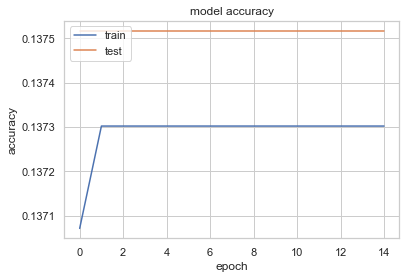

In [136]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

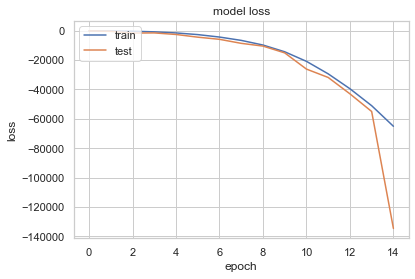

In [137]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [139]:
from sklearn.metrics import confusion_matrix
#prediction
pred = model.predict(X_test)
pred = np.argmax(pred,axis = 1) 
y_true = np.argmax(y_test,axis = 1)

cnf_matrix = confusion_matrix(y_true, pred)
print(cnf_matrix)

print(accuracy_score(y_true,pred))

TypeError: Singleton array 7 cannot be considered a valid collection.

In [ ]:
hidden_layer_sizes=(100,),
    activation='relu',
    *,
    solver='adam',
    alpha=0.0001,
    batch_size='auto',
    learning_rate='constant',
    learning_rate_init=0.001,
    power_t=0.5,
    max_iter=200,
    shuffle=True,
    random_state=None,
    tol=0.0001,
    verbose=False,
    warm_start=False,
    momentum=0.9,
    nesterovs_momentum=True,
    early_stopping=False,
    validation_fraction=0.1,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-08,
    n_iter_no_change=10,
    max_fun=15000,

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification

In [52]:
clf = MLPClassifier(random_state=1,batch_size=20,learning_rate='adaptive').fit(X_train, y_train)
# clf.predict_proba(X_test)

# clf.predict(X_test)

clf.score(X_test, y_test)

0.4836179049377019

In [32]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, TensorDataset

In [33]:
class DryBeanDataset(Dataset):
    def __init__(self, df):
#         data = pd.read_excel(path)
        data = df
        self.X = torch.Tensor(np.array(data.iloc[:, :-1], dtype=np.float32))
        self.label_encoder = LabelEncoder()
        self.standard_scaler = StandardScaler()
        self.y = torch.Tensor(self.label_encoder.fit_transform(data.iloc[:, -1]))
        self.X = torch.Tensor(self.standard_scaler.fit_transform(self.X))
        self.y_label_classes = self.label_encoder.classes_
        self.n_samples = data.shape[0]
    
    def __getitem__(self, item):
        return self.X[item], self.y[item]

    def __len__(self):
        return self.n_samples
    
    def inverse_encoder(self):
        return self.y_label_classes

In [34]:
class MLP(torch.nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(16,50)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(50, 7)


    def forward(self, x):
        output = self.fc1(x)
        output = self.relu1(output)
        output = self.fc2(output)
        return output

In [67]:
df.drop(columns='ID',inplace=True)

In [68]:
dry_bean = DryBeanDataset(df)

In [69]:
X, y = dry_bean[:]

In [70]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [71]:
X_train

tensor([[ 0.5635,  0.8273,  0.7622,  ..., -0.8439, -0.4762, -0.2243],
        [ 0.0109,  0.1038,  0.2721,  ..., -0.6720, -0.6865,  0.4000],
        [ 0.1819,  0.4497,  0.4425,  ..., -0.7484, -0.6465, -0.2097],
        ...,
        [-0.4184, -0.6062, -0.7890,  ...,  1.3845,  1.7427,  0.8929],
        [-0.4699, -0.6211, -0.7316,  ...,  0.9920,  1.1290,  0.7020],
        [ 0.8467,  1.0167,  1.0348,  ..., -0.9705, -0.5047, -2.6740]])

In [72]:
train_data = TensorDataset(X_train, y_train.type(torch.LongTensor))
test_data = TensorDataset(X_test, y_test.type(torch.LongTensor))

In [109]:
batch_size = 128
learning_rate = 0.01
num_epoch = 20

In [110]:
network = MLP()
criterion = nn.CrossEntropyLoss()
optimizer_ft = torch.optim.Adam(network.parameters(), lr=learning_rate)

In [111]:
data = {"train": train_data, "val": test_data}
dataloaders = {x: torch.utils.data.DataLoader(data[x], batch_size=batch_size, shuffle=True) for x in ['train', 'val']}
dataset_sizes = {x: len(data[x]) for x in ['train', 'val']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [112]:
import time
import copy

In [113]:
def train_model(model, criterion, optimizer, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [114]:
model_ft = train_model(network, criterion, optimizer_ft, num_epochs=num_epoch)

Epoch 0/19
----------
train Loss: 0.5281 Acc: 0.8247
val Loss: 0.2352 Acc: 0.9220

Epoch 1/19
----------
train Loss: 0.2383 Acc: 0.9152
val Loss: 0.2135 Acc: 0.9239

Epoch 2/19
----------
train Loss: 0.2248 Acc: 0.9172
val Loss: 0.1989 Acc: 0.9326

Epoch 3/19
----------
train Loss: 0.2143 Acc: 0.9208
val Loss: 0.2011 Acc: 0.9312

Epoch 4/19
----------
train Loss: 0.2125 Acc: 0.9220
val Loss: 0.2030 Acc: 0.9294

Epoch 5/19
----------
train Loss: 0.2051 Acc: 0.9235
val Loss: 0.1961 Acc: 0.9312

Epoch 6/19
----------
train Loss: 0.2020 Acc: 0.9265
val Loss: 0.2029 Acc: 0.9303

Epoch 7/19
----------
train Loss: 0.2042 Acc: 0.9233
val Loss: 0.1985 Acc: 0.9317

Epoch 8/19
----------
train Loss: 0.2011 Acc: 0.9258
val Loss: 0.1990 Acc: 0.9294

Epoch 9/19
----------
train Loss: 0.2002 Acc: 0.9250
val Loss: 0.1897 Acc: 0.9377

Epoch 10/19
----------
train Loss: 0.2004 Acc: 0.9247
val Loss: 0.1929 Acc: 0.9335

Epoch 11/19
----------
train Loss: 0.1993 Acc: 0.9274
val Loss: 0.1843 Acc: 0.9359

Ep

In [594]:
data_test = pd.read_csv('test.csv')
test=test.copy()

In [595]:
# t = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
#        'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
#        'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
#        'ShapeFactor3', 'ShapeFactor4',]

# # Box-Cox Transformation in Python
# for i in t:
    
#     test[i] = boxcox(test[i])[0]

In [621]:
X_val = test.drop(columns=['ID'], axis=1)
#y_test = data_test['y']
X_val_scaled = scaler.fit_transform(X_val)
y_pred = SVC_.predict(X_val_scaled)


In [622]:
data_test['y'] = y_pred
data_test[['ID', 'y']].to_csv('sub_x.csv', index=False)
f = pd.read_csv('sub_x.csv')
f


,ID,y
0,10834,HOROZ
1,10835,DERMASON
2,10836,BARBUNYA
3,10837,DERMASON
4,10838,BOMBAY
...,...,...
2704,13538,CALI
2705,13539,SEKER
2706,13540,HOROZ
2707,13541,DERMASON


In [196]:
test.set_index('ID',inplace=True)

In [197]:
test_scaler = scaler.transform(test)

In [198]:
test_pred = SVC_.predict(test_scaler)

In [201]:
test.reset_index(inplace=True)

In [ ]:
test = 

In [ ]:
test_df[['ID', 'y']].to_csv('submission.csv', index=False)